# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [16]:
# run this once to unzip the file
#!unzip processed-celeba-small.zip

In [17]:
from glob import glob
from typing import Tuple, Callable, Dict
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, Resize, ToTensor, Normalize , CenterCrop

import pathlib
import tests

In [18]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [19]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [Resize(size[0]),
                  CenterCrop(size[0]),
                  ToTensor()
                  ]
    #Normalize([0.5, 0.5, 0.5],[0.5, 0.5, 0.5])
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [20]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        
        self.img_dir = list(pathlib.Path(directory).glob('*'+extension))
        self.transform = transforms
        # TODO: implement the init method

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.img_dir)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        image_path = self.img_dir[index]
        img = Image.open(image_path)
        image = self.transform(img)
        return image

In [21]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

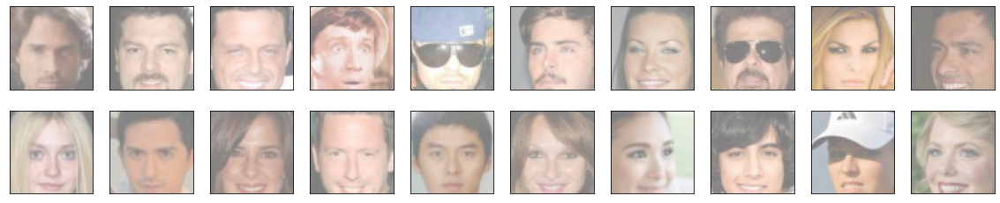

In [22]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [23]:
# helper scale function
def scale(x, feature_range=(-1, 1)):
    ''' Scale takes in an image x and returns that image, scaled
       with a feature_range of pixel values from -1 to 1. 
       This function assumes that the input x is already scaled from 0-1.'''
    # assume x is scaled to (0, 1)
    # scale to feature_range and return scaled x
    ####
    arr_min, arr_max = feature_range
    x = x * (arr_max - arr_min) + arr_min
    ####
    return x


In [24]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)

In [25]:
from torch.nn import Module

In [26]:
class ConvBlock(Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool = True):
        super(ConvBlock, self).__init__()
        
        self.conv = torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = torch.nn.BatchNorm2d(out_channels)
        self.activation = torch.nn.LeakyReLU(0.2)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [27]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
         # complete init function
        ndf = 64
        nc = 3
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            #nn.Dropout(p=0.2),
            #nn.Linear(ndf*4*4, 1),
            #nn.Sigmoid()
        )
#nn.Sigmoid()


      
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.main(x)      
        return x 

In [28]:
discriminator = Discriminator()
discriminator.apply(weights_init)

print(discriminator)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  )
)


In [29]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [30]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        ngf = 64
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( latent_dim, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.main(x)
        return x

In [31]:
generator = Generator(128)
generator.apply(weights_init)

print(generator)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [32]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [33]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    lr = 0.0002
    beta1 = 0.5
    beta2 = 0.999

    g_optimizer = torch.optim.Adam(generator.parameters(), lr, [beta1, beta2])
    d_optimizer = torch.optim.Adam(discriminator.parameters(), lr, [beta1, beta2])
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [34]:
import torch

# Check for a GPU
train_on_gpu = torch.cuda.is_available()
if not train_on_gpu:
    print('No GPU')
else:
    print('Training on GPU!')

Training on GPU!


In [35]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    """
    Wasserstein Generator Loss
    
    args:
    - fake_logits: vector of logits outputed by the discriminator with a fake input image 
    """
    loss = -fake_logits.mean()
    return loss

In [36]:
def fake_loss(D_out):
    batch_size = D_out.size(0)
    labels = torch.zeros(batch_size) # fake labels = 0
    if train_on_gpu:
        labels = labels.cuda()
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [37]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    """
    Wasserstein Discriminator Loss
    
    args:
    - real_logits: vector of logits outputed by the discriminator with a real input image
    - fake_logits: vector of logits outputed by the discriminator with a fake input image 
    """
    ####
    real_loss = -real_logits.mean()
    fake_loss = fake_logits.mean()
    loss = real_loss + fake_loss
    ####
    return loss

In [38]:
def real_loss(D_out, smooth=False):
    batch_size = D_out.size(0)
    # label smoothing
    if smooth:
        # smooth, real labels = 0.9
        labels = torch.ones(batch_size)*0.9
    else:
        labels = torch.ones(batch_size) # real labels = 1
    # move labels to GPU if available     
    if train_on_gpu:
        labels = labels.cuda()
    # binary cross entropy with logits loss
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [39]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    ####

    ####
    return gp

In [40]:
def save_model(discriminator, generator, d_optimizer, g_optimizer, filename="face_dcgan_model.pt"):
    data = dict(
        discriminator=discriminator,
        generator=generator,
        d_optimizer=d_optimizer,
        g_optimizer=g_optimizer
    )
    torch.save(data, filename)


## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [41]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    g_optimizer.zero_grad()
    z= np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z= torch.from_numpy(z).float()
    
    if train_on_gpu:
        z = z.cuda()
            
    fake_images = generator(z)
        
    D_fake = discriminator(fake_images)
    g_loss = real_loss(D_fake, True)
    g_loss.backward()
    g_optimizer.step()
    
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    d_optimizer.zero_grad()
    D_real = discriminator(real_images)
    

    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float()
    
    if train_on_gpu:
        z = z.cuda()
    
    fake_images = generator(z)
    
    D_fake = discriminator(fake_images.detach())
    
    d_real_loss = real_loss(D_real, True)
    
    d_fake_loss = fake_loss(D_fake) 
    d_loss = d_real_loss + d_fake_loss
    d_loss.backward()
    d_optimizer.step()
    
    return {'loss': d_loss, 'gp': 0}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [42]:
from datetime import datetime
import pickle as pkl

In [43]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 50

# number of images in each batch
batch_size = 64

In [44]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 5

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [45]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2023-06-03 21:37:41 | Epoch [1/50] | Batch 0/509 | d_loss: 1.5835 | g_loss: 1.9311
2023-06-03 21:37:43 | Epoch [1/50] | Batch 5/509 | d_loss: 0.5865 | g_loss: 4.4692
2023-06-03 21:37:44 | Epoch [1/50] | Batch 10/509 | d_loss: 0.5202 | g_loss: 6.0517
2023-06-03 21:37:46 | Epoch [1/50] | Batch 15/509 | d_loss: 0.4945 | g_loss: 5.8668
2023-06-03 21:37:48 | Epoch [1/50] | Batch 20/509 | d_loss: 0.3864 | g_loss: 6.0789
2023-06-03 21:37:49 | Epoch [1/50] | Batch 25/509 | d_loss: 0.4887 | g_loss: 7.6906
2023-06-03 21:37:51 | Epoch [1/50] | Batch 30/509 | d_loss: 0.4237 | g_loss: 7.5743
2023-06-03 21:37:53 | Epoch [1/50] | Batch 35/509 | d_loss: 0.3859 | g_loss: 7.2319
2023-06-03 21:37:54 | Epoch [1/50] | Batch 40/509 | d_loss: 0.4367 | g_loss: 6.2263
2023-06-03 21:37:56 | Epoch [1/50] | Batch 45/509 | d_loss: 0.6398 | g_loss: 10.7993
2023-06-03 21:37:58 | Epoch [1/50] | Batch 50/509 | d_loss: 0.3923 | g_loss: 12.0000
2023-06-03 21:37:59 | Epoch [1/50] | Batch 55/509 | d_loss: 0.8270 | g_loss:

2023-06-03 21:40:20 | Epoch [1/50] | Batch 485/509 | d_loss: 0.6533 | g_loss: 5.1643
2023-06-03 21:40:21 | Epoch [1/50] | Batch 490/509 | d_loss: 0.7082 | g_loss: 4.8572
2023-06-03 21:40:23 | Epoch [1/50] | Batch 495/509 | d_loss: 1.3234 | g_loss: 7.1662
2023-06-03 21:40:25 | Epoch [1/50] | Batch 500/509 | d_loss: 0.7374 | g_loss: 2.5197
2023-06-03 21:40:26 | Epoch [1/50] | Batch 505/509 | d_loss: 0.7268 | g_loss: 3.1832


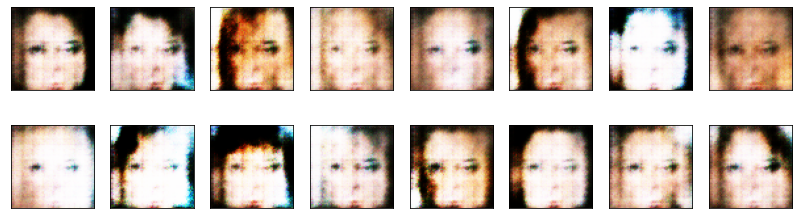

2023-06-03 21:40:29 | Epoch [2/50] | Batch 0/509 | d_loss: 0.6180 | g_loss: 2.5981
2023-06-03 21:40:31 | Epoch [2/50] | Batch 5/509 | d_loss: 0.8218 | g_loss: 2.9932
2023-06-03 21:40:32 | Epoch [2/50] | Batch 10/509 | d_loss: 0.5479 | g_loss: 3.3539
2023-06-03 21:40:34 | Epoch [2/50] | Batch 15/509 | d_loss: 0.5995 | g_loss: 4.7399
2023-06-03 21:40:35 | Epoch [2/50] | Batch 20/509 | d_loss: 0.5461 | g_loss: 3.7629
2023-06-03 21:40:37 | Epoch [2/50] | Batch 25/509 | d_loss: 0.5140 | g_loss: 3.3452
2023-06-03 21:40:39 | Epoch [2/50] | Batch 30/509 | d_loss: 0.7950 | g_loss: 2.2128
2023-06-03 21:40:40 | Epoch [2/50] | Batch 35/509 | d_loss: 0.5119 | g_loss: 3.4314
2023-06-03 21:40:42 | Epoch [2/50] | Batch 40/509 | d_loss: 0.9463 | g_loss: 5.9543
2023-06-03 21:40:44 | Epoch [2/50] | Batch 45/509 | d_loss: 1.0867 | g_loss: 1.9187
2023-06-03 21:40:45 | Epoch [2/50] | Batch 50/509 | d_loss: 0.7357 | g_loss: 3.4543
2023-06-03 21:40:47 | Epoch [2/50] | Batch 55/509 | d_loss: 2.1077 | g_loss: 4

2023-06-03 21:43:07 | Epoch [2/50] | Batch 485/509 | d_loss: 0.6481 | g_loss: 4.5601
2023-06-03 21:43:09 | Epoch [2/50] | Batch 490/509 | d_loss: 0.8611 | g_loss: 5.6220
2023-06-03 21:43:11 | Epoch [2/50] | Batch 495/509 | d_loss: 1.1509 | g_loss: 5.2944
2023-06-03 21:43:12 | Epoch [2/50] | Batch 500/509 | d_loss: 0.7478 | g_loss: 1.8390
2023-06-03 21:43:14 | Epoch [2/50] | Batch 505/509 | d_loss: 0.5302 | g_loss: 3.6192


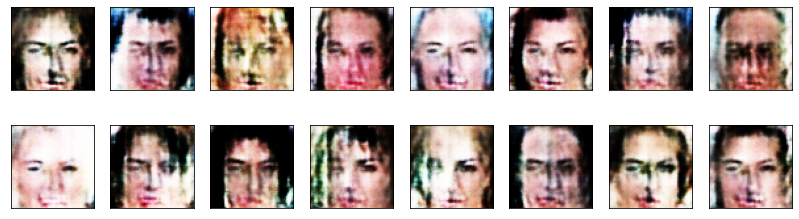

2023-06-03 21:43:16 | Epoch [3/50] | Batch 0/509 | d_loss: 0.8086 | g_loss: 4.5087
2023-06-03 21:43:18 | Epoch [3/50] | Batch 5/509 | d_loss: 0.6532 | g_loss: 3.8521
2023-06-03 21:43:20 | Epoch [3/50] | Batch 10/509 | d_loss: 0.5757 | g_loss: 3.5678
2023-06-03 21:43:21 | Epoch [3/50] | Batch 15/509 | d_loss: 1.0358 | g_loss: 2.5198
2023-06-03 21:43:23 | Epoch [3/50] | Batch 20/509 | d_loss: 0.6446 | g_loss: 3.2416
2023-06-03 21:43:24 | Epoch [3/50] | Batch 25/509 | d_loss: 0.6008 | g_loss: 2.7944
2023-06-03 21:43:26 | Epoch [3/50] | Batch 30/509 | d_loss: 0.7491 | g_loss: 4.6228
2023-06-03 21:43:28 | Epoch [3/50] | Batch 35/509 | d_loss: 1.5078 | g_loss: 7.7032
2023-06-03 21:43:29 | Epoch [3/50] | Batch 40/509 | d_loss: 0.8590 | g_loss: 3.6583
2023-06-03 21:43:31 | Epoch [3/50] | Batch 45/509 | d_loss: 0.7018 | g_loss: 3.6795
2023-06-03 21:43:33 | Epoch [3/50] | Batch 50/509 | d_loss: 0.9677 | g_loss: 1.5652
2023-06-03 21:43:34 | Epoch [3/50] | Batch 55/509 | d_loss: 0.7066 | g_loss: 2

2023-06-03 21:45:55 | Epoch [3/50] | Batch 485/509 | d_loss: 0.5700 | g_loss: 2.4048
2023-06-03 21:45:56 | Epoch [3/50] | Batch 490/509 | d_loss: 0.7340 | g_loss: 5.4971
2023-06-03 21:45:58 | Epoch [3/50] | Batch 495/509 | d_loss: 0.9033 | g_loss: 1.1636
2023-06-03 21:45:59 | Epoch [3/50] | Batch 500/509 | d_loss: 0.6615 | g_loss: 3.0735
2023-06-03 21:46:01 | Epoch [3/50] | Batch 505/509 | d_loss: 0.8166 | g_loss: 1.7949


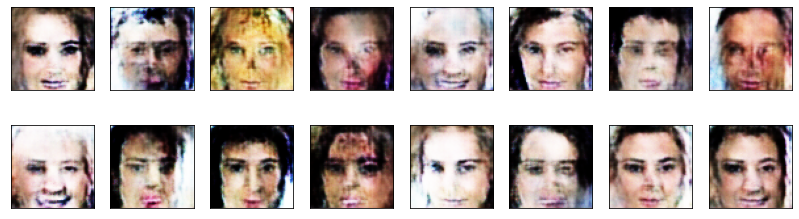

2023-06-03 21:46:04 | Epoch [4/50] | Batch 0/509 | d_loss: 0.6472 | g_loss: 2.7508
2023-06-03 21:46:05 | Epoch [4/50] | Batch 5/509 | d_loss: 0.8732 | g_loss: 1.8801
2023-06-03 21:46:07 | Epoch [4/50] | Batch 10/509 | d_loss: 0.5075 | g_loss: 3.2646
2023-06-03 21:46:09 | Epoch [4/50] | Batch 15/509 | d_loss: 0.8752 | g_loss: 2.7704
2023-06-03 21:46:10 | Epoch [4/50] | Batch 20/509 | d_loss: 1.0238 | g_loss: 4.8691
2023-06-03 21:46:12 | Epoch [4/50] | Batch 25/509 | d_loss: 0.5561 | g_loss: 2.5653
2023-06-03 21:46:13 | Epoch [4/50] | Batch 30/509 | d_loss: 0.5365 | g_loss: 3.2961
2023-06-03 21:46:15 | Epoch [4/50] | Batch 35/509 | d_loss: 0.7391 | g_loss: 4.2413
2023-06-03 21:46:17 | Epoch [4/50] | Batch 40/509 | d_loss: 0.5027 | g_loss: 3.0971
2023-06-03 21:46:18 | Epoch [4/50] | Batch 45/509 | d_loss: 0.5452 | g_loss: 3.1175
2023-06-03 21:46:20 | Epoch [4/50] | Batch 50/509 | d_loss: 0.8685 | g_loss: 5.2794
2023-06-03 21:46:22 | Epoch [4/50] | Batch 55/509 | d_loss: 0.6886 | g_loss: 4

2023-06-03 21:48:42 | Epoch [4/50] | Batch 485/509 | d_loss: 0.7194 | g_loss: 5.1763
2023-06-03 21:48:44 | Epoch [4/50] | Batch 490/509 | d_loss: 0.5378 | g_loss: 4.4847
2023-06-03 21:48:45 | Epoch [4/50] | Batch 495/509 | d_loss: 0.7952 | g_loss: 4.9133
2023-06-03 21:48:47 | Epoch [4/50] | Batch 500/509 | d_loss: 0.5740 | g_loss: 3.6126
2023-06-03 21:48:49 | Epoch [4/50] | Batch 505/509 | d_loss: 0.6327 | g_loss: 1.8622


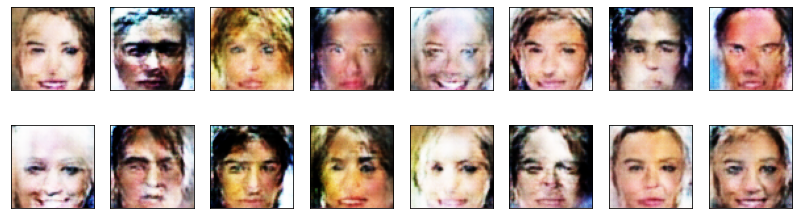

2023-06-03 21:48:51 | Epoch [5/50] | Batch 0/509 | d_loss: 0.3935 | g_loss: 4.3484
2023-06-03 21:48:53 | Epoch [5/50] | Batch 5/509 | d_loss: 0.7415 | g_loss: 4.5296
2023-06-03 21:48:54 | Epoch [5/50] | Batch 10/509 | d_loss: 0.5568 | g_loss: 2.2751
2023-06-03 21:48:56 | Epoch [5/50] | Batch 15/509 | d_loss: 0.5227 | g_loss: 2.1914
2023-06-03 21:48:58 | Epoch [5/50] | Batch 20/509 | d_loss: 0.5387 | g_loss: 3.8079
2023-06-03 21:48:59 | Epoch [5/50] | Batch 25/509 | d_loss: 0.4982 | g_loss: 3.3680
2023-06-03 21:49:01 | Epoch [5/50] | Batch 30/509 | d_loss: 1.1596 | g_loss: 6.1887
2023-06-03 21:49:02 | Epoch [5/50] | Batch 35/509 | d_loss: 0.6744 | g_loss: 3.7342
2023-06-03 21:49:04 | Epoch [5/50] | Batch 40/509 | d_loss: 0.4360 | g_loss: 3.0047
2023-06-03 21:49:06 | Epoch [5/50] | Batch 45/509 | d_loss: 0.5524 | g_loss: 3.0629
2023-06-03 21:49:07 | Epoch [5/50] | Batch 50/509 | d_loss: 0.6669 | g_loss: 4.3610
2023-06-03 21:49:09 | Epoch [5/50] | Batch 55/509 | d_loss: 0.7972 | g_loss: 1

2023-06-03 21:51:30 | Epoch [5/50] | Batch 485/509 | d_loss: 0.5828 | g_loss: 2.7339
2023-06-03 21:51:32 | Epoch [5/50] | Batch 490/509 | d_loss: 0.9067 | g_loss: 4.9629
2023-06-03 21:51:33 | Epoch [5/50] | Batch 495/509 | d_loss: 0.4027 | g_loss: 4.5397
2023-06-03 21:51:35 | Epoch [5/50] | Batch 500/509 | d_loss: 0.4264 | g_loss: 3.4066
2023-06-03 21:51:36 | Epoch [5/50] | Batch 505/509 | d_loss: 1.3268 | g_loss: 6.4902


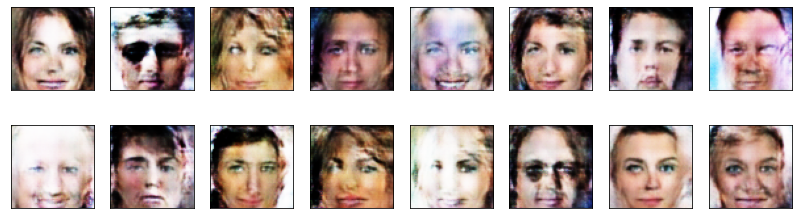

2023-06-03 21:51:39 | Epoch [6/50] | Batch 0/509 | d_loss: 0.6752 | g_loss: 2.2473
2023-06-03 21:51:41 | Epoch [6/50] | Batch 5/509 | d_loss: 0.4410 | g_loss: 3.6377
2023-06-03 21:51:42 | Epoch [6/50] | Batch 10/509 | d_loss: 0.6905 | g_loss: 4.4320
2023-06-03 21:51:44 | Epoch [6/50] | Batch 15/509 | d_loss: 0.4569 | g_loss: 3.3058
2023-06-03 21:51:46 | Epoch [6/50] | Batch 20/509 | d_loss: 0.4342 | g_loss: 4.1861
2023-06-03 21:51:47 | Epoch [6/50] | Batch 25/509 | d_loss: 0.3827 | g_loss: 4.1642
2023-06-03 21:51:49 | Epoch [6/50] | Batch 30/509 | d_loss: 1.2549 | g_loss: 5.2491
2023-06-03 21:51:51 | Epoch [6/50] | Batch 35/509 | d_loss: 0.5679 | g_loss: 1.9083
2023-06-03 21:51:52 | Epoch [6/50] | Batch 40/509 | d_loss: 0.4335 | g_loss: 3.4931
2023-06-03 21:51:54 | Epoch [6/50] | Batch 45/509 | d_loss: 0.5595 | g_loss: 2.8803
2023-06-03 21:51:56 | Epoch [6/50] | Batch 50/509 | d_loss: 0.3954 | g_loss: 4.5489
2023-06-03 21:51:57 | Epoch [6/50] | Batch 55/509 | d_loss: 0.5239 | g_loss: 3

2023-06-03 21:54:19 | Epoch [6/50] | Batch 485/509 | d_loss: 0.8871 | g_loss: 4.0539
2023-06-03 21:54:21 | Epoch [6/50] | Batch 490/509 | d_loss: 0.6180 | g_loss: 2.8532
2023-06-03 21:54:22 | Epoch [6/50] | Batch 495/509 | d_loss: 0.4167 | g_loss: 3.5504
2023-06-03 21:54:24 | Epoch [6/50] | Batch 500/509 | d_loss: 0.4374 | g_loss: 3.7760
2023-06-03 21:54:25 | Epoch [6/50] | Batch 505/509 | d_loss: 0.7575 | g_loss: 5.5485


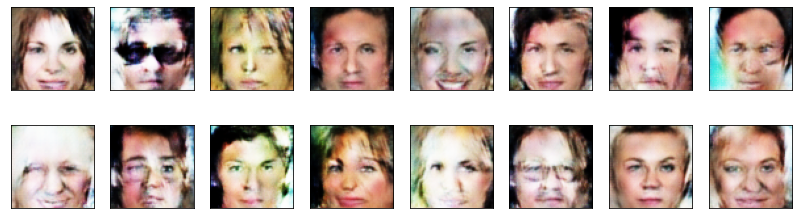

2023-06-03 21:54:28 | Epoch [7/50] | Batch 0/509 | d_loss: 0.5254 | g_loss: 2.7907
2023-06-03 21:54:30 | Epoch [7/50] | Batch 5/509 | d_loss: 0.3810 | g_loss: 4.0368
2023-06-03 21:54:31 | Epoch [7/50] | Batch 10/509 | d_loss: 0.4820 | g_loss: 2.4240
2023-06-03 21:54:33 | Epoch [7/50] | Batch 15/509 | d_loss: 0.6046 | g_loss: 2.8296
2023-06-03 21:54:35 | Epoch [7/50] | Batch 20/509 | d_loss: 0.5146 | g_loss: 3.6917
2023-06-03 21:54:36 | Epoch [7/50] | Batch 25/509 | d_loss: 1.8236 | g_loss: 3.9636
2023-06-03 21:54:38 | Epoch [7/50] | Batch 30/509 | d_loss: 0.5542 | g_loss: 3.5951
2023-06-03 21:54:40 | Epoch [7/50] | Batch 35/509 | d_loss: 0.4429 | g_loss: 2.5371
2023-06-03 21:54:41 | Epoch [7/50] | Batch 40/509 | d_loss: 0.4848 | g_loss: 3.4281
2023-06-03 21:54:43 | Epoch [7/50] | Batch 45/509 | d_loss: 0.5144 | g_loss: 2.8046
2023-06-03 21:54:44 | Epoch [7/50] | Batch 50/509 | d_loss: 0.5537 | g_loss: 5.0571
2023-06-03 21:54:46 | Epoch [7/50] | Batch 55/509 | d_loss: 0.4148 | g_loss: 3

2023-06-03 21:57:07 | Epoch [7/50] | Batch 485/509 | d_loss: 0.6878 | g_loss: 3.7931
2023-06-03 21:57:09 | Epoch [7/50] | Batch 490/509 | d_loss: 0.6007 | g_loss: 4.2600
2023-06-03 21:57:11 | Epoch [7/50] | Batch 495/509 | d_loss: 0.3792 | g_loss: 4.6010
2023-06-03 21:57:12 | Epoch [7/50] | Batch 500/509 | d_loss: 0.4225 | g_loss: 3.6140
2023-06-03 21:57:14 | Epoch [7/50] | Batch 505/509 | d_loss: 1.0665 | g_loss: 3.2162


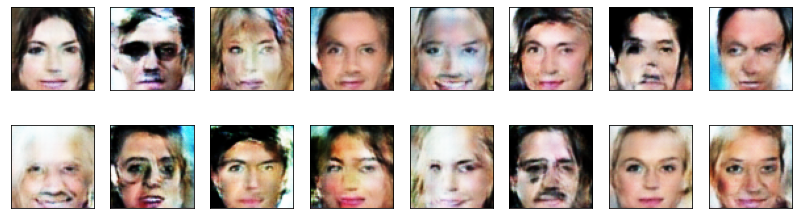

2023-06-03 21:57:16 | Epoch [8/50] | Batch 0/509 | d_loss: 0.4703 | g_loss: 3.0397
2023-06-03 21:57:18 | Epoch [8/50] | Batch 5/509 | d_loss: 0.4768 | g_loss: 2.9763
2023-06-03 21:57:20 | Epoch [8/50] | Batch 10/509 | d_loss: 0.3777 | g_loss: 4.3025
2023-06-03 21:57:21 | Epoch [8/50] | Batch 15/509 | d_loss: 0.3805 | g_loss: 4.0536
2023-06-03 21:57:23 | Epoch [8/50] | Batch 20/509 | d_loss: 0.7545 | g_loss: 5.3311
2023-06-03 21:57:25 | Epoch [8/50] | Batch 25/509 | d_loss: 1.1222 | g_loss: 6.2289
2023-06-03 21:57:26 | Epoch [8/50] | Batch 30/509 | d_loss: 0.4284 | g_loss: 4.7271
2023-06-03 21:57:28 | Epoch [8/50] | Batch 35/509 | d_loss: 0.4551 | g_loss: 3.3057
2023-06-03 21:57:30 | Epoch [8/50] | Batch 40/509 | d_loss: 0.5544 | g_loss: 3.7106
2023-06-03 21:57:31 | Epoch [8/50] | Batch 45/509 | d_loss: 0.6301 | g_loss: 3.5298
2023-06-03 21:57:33 | Epoch [8/50] | Batch 50/509 | d_loss: 0.8727 | g_loss: 7.5735
2023-06-03 21:57:35 | Epoch [8/50] | Batch 55/509 | d_loss: 0.9920 | g_loss: 4

2023-06-03 21:59:56 | Epoch [8/50] | Batch 485/509 | d_loss: 0.4451 | g_loss: 4.3100
2023-06-03 21:59:58 | Epoch [8/50] | Batch 490/509 | d_loss: 0.3514 | g_loss: 6.1404
2023-06-03 22:00:00 | Epoch [8/50] | Batch 495/509 | d_loss: 0.4092 | g_loss: 3.7974
2023-06-03 22:00:01 | Epoch [8/50] | Batch 500/509 | d_loss: 0.6256 | g_loss: 2.0362
2023-06-03 22:00:03 | Epoch [8/50] | Batch 505/509 | d_loss: 0.4442 | g_loss: 4.0137


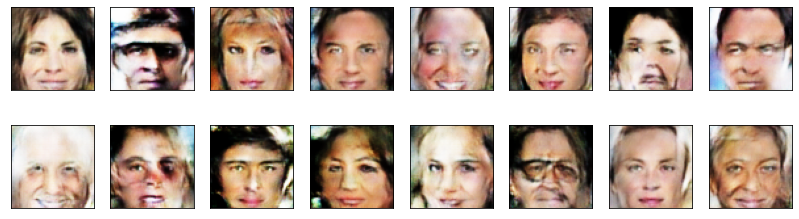

2023-06-03 22:00:05 | Epoch [9/50] | Batch 0/509 | d_loss: 0.3582 | g_loss: 5.5656
2023-06-03 22:00:07 | Epoch [9/50] | Batch 5/509 | d_loss: 0.5465 | g_loss: 3.3306
2023-06-03 22:00:09 | Epoch [9/50] | Batch 10/509 | d_loss: 0.3818 | g_loss: 4.1798
2023-06-03 22:00:10 | Epoch [9/50] | Batch 15/509 | d_loss: 0.3466 | g_loss: 5.4500
2023-06-03 22:00:12 | Epoch [9/50] | Batch 20/509 | d_loss: 0.3700 | g_loss: 4.1656
2023-06-03 22:00:14 | Epoch [9/50] | Batch 25/509 | d_loss: 0.3523 | g_loss: 6.4795
2023-06-03 22:00:15 | Epoch [9/50] | Batch 30/509 | d_loss: 0.6344 | g_loss: 4.7009
2023-06-03 22:00:17 | Epoch [9/50] | Batch 35/509 | d_loss: 0.5782 | g_loss: 4.3967
2023-06-03 22:00:19 | Epoch [9/50] | Batch 40/509 | d_loss: 0.4748 | g_loss: 3.9299
2023-06-03 22:00:20 | Epoch [9/50] | Batch 45/509 | d_loss: 0.3470 | g_loss: 4.4937
2023-06-03 22:00:22 | Epoch [9/50] | Batch 50/509 | d_loss: 1.0643 | g_loss: 5.1998
2023-06-03 22:00:24 | Epoch [9/50] | Batch 55/509 | d_loss: 0.4420 | g_loss: 4

2023-06-03 22:02:46 | Epoch [9/50] | Batch 485/509 | d_loss: 1.0541 | g_loss: 4.0703
2023-06-03 22:02:47 | Epoch [9/50] | Batch 490/509 | d_loss: 0.4037 | g_loss: 3.5458
2023-06-03 22:02:49 | Epoch [9/50] | Batch 495/509 | d_loss: 0.3995 | g_loss: 4.2977
2023-06-03 22:02:50 | Epoch [9/50] | Batch 500/509 | d_loss: 0.4642 | g_loss: 3.4390
2023-06-03 22:02:52 | Epoch [9/50] | Batch 505/509 | d_loss: 0.4753 | g_loss: 3.0617


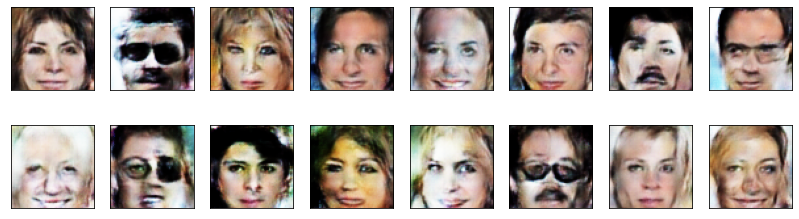

2023-06-03 22:02:55 | Epoch [10/50] | Batch 0/509 | d_loss: 0.6930 | g_loss: 4.1981
2023-06-03 22:02:56 | Epoch [10/50] | Batch 5/509 | d_loss: 0.6767 | g_loss: 4.7939
2023-06-03 22:02:58 | Epoch [10/50] | Batch 10/509 | d_loss: 0.6652 | g_loss: 3.2189
2023-06-03 22:03:00 | Epoch [10/50] | Batch 15/509 | d_loss: 0.4110 | g_loss: 3.5783
2023-06-03 22:03:01 | Epoch [10/50] | Batch 20/509 | d_loss: 0.3868 | g_loss: 3.5079
2023-06-03 22:03:03 | Epoch [10/50] | Batch 25/509 | d_loss: 0.5053 | g_loss: 4.3147
2023-06-03 22:03:04 | Epoch [10/50] | Batch 30/509 | d_loss: 1.4955 | g_loss: 0.7797
2023-06-03 22:03:06 | Epoch [10/50] | Batch 35/509 | d_loss: 0.6217 | g_loss: 4.2931
2023-06-03 22:03:08 | Epoch [10/50] | Batch 40/509 | d_loss: 0.4455 | g_loss: 2.9389
2023-06-03 22:03:09 | Epoch [10/50] | Batch 45/509 | d_loss: 0.5168 | g_loss: 2.6844
2023-06-03 22:03:11 | Epoch [10/50] | Batch 50/509 | d_loss: 0.4118 | g_loss: 3.3455
2023-06-03 22:03:13 | Epoch [10/50] | Batch 55/509 | d_loss: 0.4862

2023-06-03 22:05:34 | Epoch [10/50] | Batch 480/509 | d_loss: 0.7620 | g_loss: 6.3678
2023-06-03 22:05:35 | Epoch [10/50] | Batch 485/509 | d_loss: 0.3775 | g_loss: 4.5576
2023-06-03 22:05:37 | Epoch [10/50] | Batch 490/509 | d_loss: 0.3914 | g_loss: 5.1360
2023-06-03 22:05:39 | Epoch [10/50] | Batch 495/509 | d_loss: 0.4775 | g_loss: 3.7083
2023-06-03 22:05:40 | Epoch [10/50] | Batch 500/509 | d_loss: 0.3994 | g_loss: 5.1069
2023-06-03 22:05:42 | Epoch [10/50] | Batch 505/509 | d_loss: 0.3966 | g_loss: 3.2025


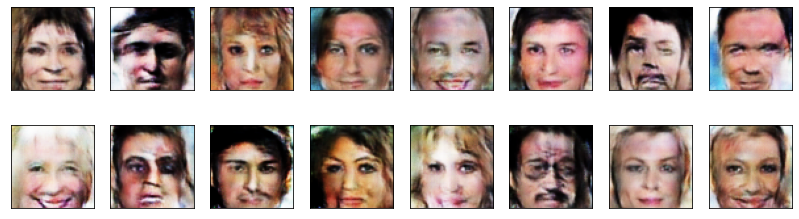

2023-06-03 22:05:45 | Epoch [11/50] | Batch 0/509 | d_loss: 0.5117 | g_loss: 4.9893
2023-06-03 22:05:47 | Epoch [11/50] | Batch 5/509 | d_loss: 0.3469 | g_loss: 5.4760
2023-06-03 22:05:48 | Epoch [11/50] | Batch 10/509 | d_loss: 0.4186 | g_loss: 3.2685
2023-06-03 22:05:50 | Epoch [11/50] | Batch 15/509 | d_loss: 0.6434 | g_loss: 2.3843
2023-06-03 22:05:52 | Epoch [11/50] | Batch 20/509 | d_loss: 0.4603 | g_loss: 3.4060
2023-06-03 22:05:53 | Epoch [11/50] | Batch 25/509 | d_loss: 0.4928 | g_loss: 3.0301
2023-06-03 22:05:55 | Epoch [11/50] | Batch 30/509 | d_loss: 0.7601 | g_loss: 5.0014
2023-06-03 22:05:57 | Epoch [11/50] | Batch 35/509 | d_loss: 0.4950 | g_loss: 6.7376
2023-06-03 22:05:59 | Epoch [11/50] | Batch 40/509 | d_loss: 0.5222 | g_loss: 4.1193
2023-06-03 22:06:00 | Epoch [11/50] | Batch 45/509 | d_loss: 0.3932 | g_loss: 4.1422
2023-06-03 22:06:02 | Epoch [11/50] | Batch 50/509 | d_loss: 0.4146 | g_loss: 3.2263
2023-06-03 22:06:04 | Epoch [11/50] | Batch 55/509 | d_loss: 0.4125

2023-06-03 22:08:27 | Epoch [11/50] | Batch 480/509 | d_loss: 0.3583 | g_loss: 4.8647
2023-06-03 22:08:29 | Epoch [11/50] | Batch 485/509 | d_loss: 0.3723 | g_loss: 4.7821
2023-06-03 22:08:30 | Epoch [11/50] | Batch 490/509 | d_loss: 0.4344 | g_loss: 3.3893
2023-06-03 22:08:32 | Epoch [11/50] | Batch 495/509 | d_loss: 0.3905 | g_loss: 3.4611
2023-06-03 22:08:34 | Epoch [11/50] | Batch 500/509 | d_loss: 0.4044 | g_loss: 3.4920
2023-06-03 22:08:35 | Epoch [11/50] | Batch 505/509 | d_loss: 0.4350 | g_loss: 4.6547


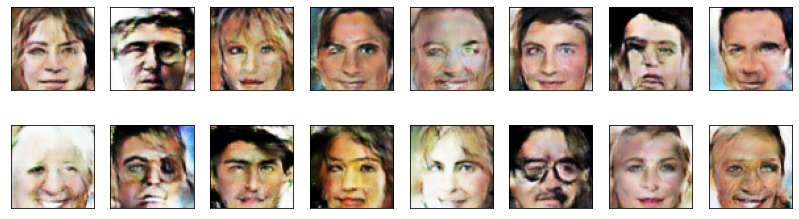

2023-06-03 22:08:38 | Epoch [12/50] | Batch 0/509 | d_loss: 0.4175 | g_loss: 3.7269
2023-06-03 22:08:39 | Epoch [12/50] | Batch 5/509 | d_loss: 0.5890 | g_loss: 3.9542
2023-06-03 22:08:41 | Epoch [12/50] | Batch 10/509 | d_loss: 0.6536 | g_loss: 5.3459
2023-06-03 22:08:43 | Epoch [12/50] | Batch 15/509 | d_loss: 0.4315 | g_loss: 4.3601
2023-06-03 22:08:44 | Epoch [12/50] | Batch 20/509 | d_loss: 0.4899 | g_loss: 5.7190
2023-06-03 22:08:46 | Epoch [12/50] | Batch 25/509 | d_loss: 0.3783 | g_loss: 3.7432
2023-06-03 22:08:47 | Epoch [12/50] | Batch 30/509 | d_loss: 0.3633 | g_loss: 7.5317
2023-06-03 22:08:49 | Epoch [12/50] | Batch 35/509 | d_loss: 0.4794 | g_loss: 3.6441
2023-06-03 22:08:51 | Epoch [12/50] | Batch 40/509 | d_loss: 0.5767 | g_loss: 4.7648
2023-06-03 22:08:52 | Epoch [12/50] | Batch 45/509 | d_loss: 0.5208 | g_loss: 3.6477
2023-06-03 22:08:54 | Epoch [12/50] | Batch 50/509 | d_loss: 0.4713 | g_loss: 3.7318
2023-06-03 22:08:56 | Epoch [12/50] | Batch 55/509 | d_loss: 0.3759

2023-06-03 22:11:15 | Epoch [12/50] | Batch 480/509 | d_loss: 0.4543 | g_loss: 4.4143
2023-06-03 22:11:17 | Epoch [12/50] | Batch 485/509 | d_loss: 0.3832 | g_loss: 5.8357
2023-06-03 22:11:18 | Epoch [12/50] | Batch 490/509 | d_loss: 0.5160 | g_loss: 3.9731
2023-06-03 22:11:20 | Epoch [12/50] | Batch 495/509 | d_loss: 0.4524 | g_loss: 3.9636
2023-06-03 22:11:22 | Epoch [12/50] | Batch 500/509 | d_loss: 0.5774 | g_loss: 6.1407
2023-06-03 22:11:23 | Epoch [12/50] | Batch 505/509 | d_loss: 1.5556 | g_loss: 7.0028


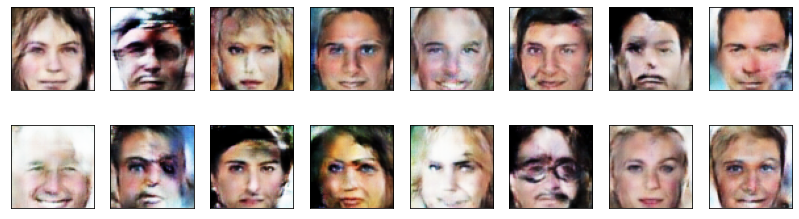

2023-06-03 22:11:26 | Epoch [13/50] | Batch 0/509 | d_loss: 0.4961 | g_loss: 4.1978
2023-06-03 22:11:28 | Epoch [13/50] | Batch 5/509 | d_loss: 0.4643 | g_loss: 3.5525
2023-06-03 22:11:29 | Epoch [13/50] | Batch 10/509 | d_loss: 0.4508 | g_loss: 3.8280
2023-06-03 22:11:31 | Epoch [13/50] | Batch 15/509 | d_loss: 0.4077 | g_loss: 4.1446
2023-06-03 22:11:32 | Epoch [13/50] | Batch 20/509 | d_loss: 0.4833 | g_loss: 3.6254
2023-06-03 22:11:34 | Epoch [13/50] | Batch 25/509 | d_loss: 0.3699 | g_loss: 3.8595
2023-06-03 22:11:36 | Epoch [13/50] | Batch 30/509 | d_loss: 0.4378 | g_loss: 2.9336
2023-06-03 22:11:37 | Epoch [13/50] | Batch 35/509 | d_loss: 0.4123 | g_loss: 3.6858
2023-06-03 22:11:39 | Epoch [13/50] | Batch 40/509 | d_loss: 0.8067 | g_loss: 5.6567
2023-06-03 22:11:41 | Epoch [13/50] | Batch 45/509 | d_loss: 0.3930 | g_loss: 3.6053
2023-06-03 22:11:42 | Epoch [13/50] | Batch 50/509 | d_loss: 0.4561 | g_loss: 5.2851
2023-06-03 22:11:44 | Epoch [13/50] | Batch 55/509 | d_loss: 0.4140

2023-06-03 22:14:03 | Epoch [13/50] | Batch 480/509 | d_loss: 0.4020 | g_loss: 3.6697
2023-06-03 22:14:05 | Epoch [13/50] | Batch 485/509 | d_loss: 0.5670 | g_loss: 1.9850
2023-06-03 22:14:06 | Epoch [13/50] | Batch 490/509 | d_loss: 0.4697 | g_loss: 5.3870
2023-06-03 22:14:08 | Epoch [13/50] | Batch 495/509 | d_loss: 0.4693 | g_loss: 3.5453
2023-06-03 22:14:10 | Epoch [13/50] | Batch 500/509 | d_loss: 0.4120 | g_loss: 4.2181
2023-06-03 22:14:11 | Epoch [13/50] | Batch 505/509 | d_loss: 0.4259 | g_loss: 3.8734


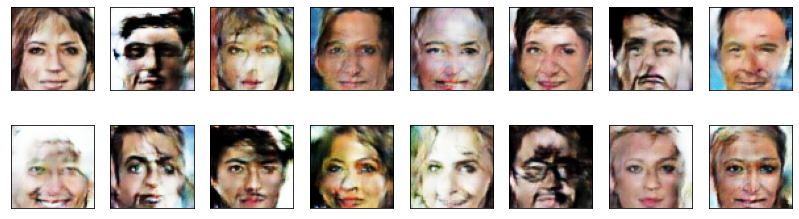

2023-06-03 22:14:14 | Epoch [14/50] | Batch 0/509 | d_loss: 0.4493 | g_loss: 2.9203
2023-06-03 22:14:15 | Epoch [14/50] | Batch 5/509 | d_loss: 0.4219 | g_loss: 4.9761
2023-06-03 22:14:17 | Epoch [14/50] | Batch 10/509 | d_loss: 0.3915 | g_loss: 6.3802
2023-06-03 22:14:19 | Epoch [14/50] | Batch 15/509 | d_loss: 0.3924 | g_loss: 3.7703
2023-06-03 22:14:20 | Epoch [14/50] | Batch 20/509 | d_loss: 0.6410 | g_loss: 3.9519
2023-06-03 22:14:22 | Epoch [14/50] | Batch 25/509 | d_loss: 0.6801 | g_loss: 4.9864
2023-06-03 22:14:24 | Epoch [14/50] | Batch 30/509 | d_loss: 0.7619 | g_loss: 3.6714
2023-06-03 22:14:25 | Epoch [14/50] | Batch 35/509 | d_loss: 0.3779 | g_loss: 4.7433
2023-06-03 22:14:27 | Epoch [14/50] | Batch 40/509 | d_loss: 0.4814 | g_loss: 4.2817
2023-06-03 22:14:28 | Epoch [14/50] | Batch 45/509 | d_loss: 0.5278 | g_loss: 3.8579
2023-06-03 22:14:30 | Epoch [14/50] | Batch 50/509 | d_loss: 0.4675 | g_loss: 2.9672
2023-06-03 22:14:32 | Epoch [14/50] | Batch 55/509 | d_loss: 0.4494

2023-06-03 22:16:51 | Epoch [14/50] | Batch 480/509 | d_loss: 0.4165 | g_loss: 3.2984
2023-06-03 22:16:53 | Epoch [14/50] | Batch 485/509 | d_loss: 0.3788 | g_loss: 6.7458
2023-06-03 22:16:54 | Epoch [14/50] | Batch 490/509 | d_loss: 0.4380 | g_loss: 3.3667
2023-06-03 22:16:56 | Epoch [14/50] | Batch 495/509 | d_loss: 2.4069 | g_loss: 9.5882
2023-06-03 22:16:57 | Epoch [14/50] | Batch 500/509 | d_loss: 0.7013 | g_loss: 3.6215
2023-06-03 22:16:59 | Epoch [14/50] | Batch 505/509 | d_loss: 1.0007 | g_loss: 1.9380


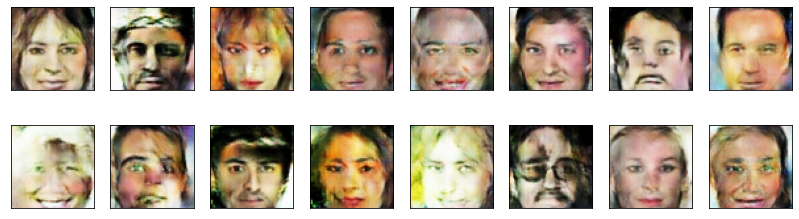

2023-06-03 22:17:02 | Epoch [15/50] | Batch 0/509 | d_loss: 0.4904 | g_loss: 4.6255
2023-06-03 22:17:03 | Epoch [15/50] | Batch 5/509 | d_loss: 0.7230 | g_loss: 4.3205
2023-06-03 22:17:05 | Epoch [15/50] | Batch 10/509 | d_loss: 0.9775 | g_loss: 4.4742
2023-06-03 22:17:07 | Epoch [15/50] | Batch 15/509 | d_loss: 0.4729 | g_loss: 2.5992
2023-06-03 22:17:08 | Epoch [15/50] | Batch 20/509 | d_loss: 0.5259 | g_loss: 4.0266
2023-06-03 22:17:10 | Epoch [15/50] | Batch 25/509 | d_loss: 0.6251 | g_loss: 4.3853
2023-06-03 22:17:12 | Epoch [15/50] | Batch 30/509 | d_loss: 0.6042 | g_loss: 2.7449
2023-06-03 22:17:13 | Epoch [15/50] | Batch 35/509 | d_loss: 0.5087 | g_loss: 2.8710
2023-06-03 22:17:15 | Epoch [15/50] | Batch 40/509 | d_loss: 0.5589 | g_loss: 2.5429
2023-06-03 22:17:16 | Epoch [15/50] | Batch 45/509 | d_loss: 0.4802 | g_loss: 2.8788
2023-06-03 22:17:18 | Epoch [15/50] | Batch 50/509 | d_loss: 0.4526 | g_loss: 3.5417
2023-06-03 22:17:20 | Epoch [15/50] | Batch 55/509 | d_loss: 0.5950

2023-06-03 22:19:39 | Epoch [15/50] | Batch 480/509 | d_loss: 0.3849 | g_loss: 3.5002
2023-06-03 22:19:41 | Epoch [15/50] | Batch 485/509 | d_loss: 0.8322 | g_loss: 2.6618
2023-06-03 22:19:42 | Epoch [15/50] | Batch 490/509 | d_loss: 0.4581 | g_loss: 3.8593
2023-06-03 22:19:44 | Epoch [15/50] | Batch 495/509 | d_loss: 0.4288 | g_loss: 3.1896
2023-06-03 22:19:46 | Epoch [15/50] | Batch 500/509 | d_loss: 0.4106 | g_loss: 3.1941
2023-06-03 22:19:47 | Epoch [15/50] | Batch 505/509 | d_loss: 0.4677 | g_loss: 3.5376


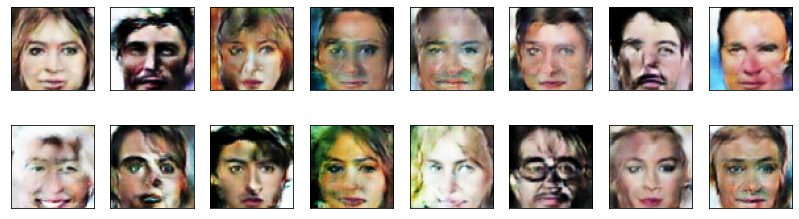

2023-06-03 22:19:50 | Epoch [16/50] | Batch 0/509 | d_loss: 0.3816 | g_loss: 4.3664
2023-06-03 22:19:51 | Epoch [16/50] | Batch 5/509 | d_loss: 0.5258 | g_loss: 3.6139
2023-06-03 22:19:53 | Epoch [16/50] | Batch 10/509 | d_loss: 0.4107 | g_loss: 4.4026
2023-06-03 22:19:55 | Epoch [16/50] | Batch 15/509 | d_loss: 0.5090 | g_loss: 2.1713
2023-06-03 22:19:56 | Epoch [16/50] | Batch 20/509 | d_loss: 0.3953 | g_loss: 3.9351
2023-06-03 22:19:58 | Epoch [16/50] | Batch 25/509 | d_loss: 0.3960 | g_loss: 4.2549
2023-06-03 22:20:00 | Epoch [16/50] | Batch 30/509 | d_loss: 0.4950 | g_loss: 4.7597
2023-06-03 22:20:01 | Epoch [16/50] | Batch 35/509 | d_loss: 0.3756 | g_loss: 4.1070
2023-06-03 22:20:03 | Epoch [16/50] | Batch 40/509 | d_loss: 0.3547 | g_loss: 4.6140
2023-06-03 22:20:04 | Epoch [16/50] | Batch 45/509 | d_loss: 0.3830 | g_loss: 4.0617
2023-06-03 22:20:06 | Epoch [16/50] | Batch 50/509 | d_loss: 0.6417 | g_loss: 4.9400
2023-06-03 22:20:08 | Epoch [16/50] | Batch 55/509 | d_loss: 0.4038

2023-06-03 22:22:27 | Epoch [16/50] | Batch 480/509 | d_loss: 1.6974 | g_loss: 1.3253
2023-06-03 22:22:29 | Epoch [16/50] | Batch 485/509 | d_loss: 0.6185 | g_loss: 4.2517
2023-06-03 22:22:30 | Epoch [16/50] | Batch 490/509 | d_loss: 0.6002 | g_loss: 2.2214
2023-06-03 22:22:32 | Epoch [16/50] | Batch 495/509 | d_loss: 0.5658 | g_loss: 3.2862
2023-06-03 22:22:34 | Epoch [16/50] | Batch 500/509 | d_loss: 0.4232 | g_loss: 3.0948
2023-06-03 22:22:35 | Epoch [16/50] | Batch 505/509 | d_loss: 0.4100 | g_loss: 3.7025


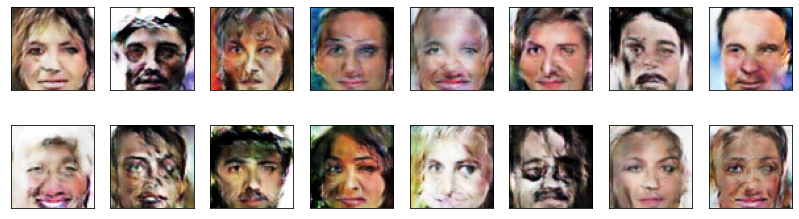

2023-06-03 22:22:38 | Epoch [17/50] | Batch 0/509 | d_loss: 0.3925 | g_loss: 3.2765
2023-06-03 22:22:39 | Epoch [17/50] | Batch 5/509 | d_loss: 0.3609 | g_loss: 4.3182
2023-06-03 22:22:41 | Epoch [17/50] | Batch 10/509 | d_loss: 0.4824 | g_loss: 4.2289
2023-06-03 22:22:43 | Epoch [17/50] | Batch 15/509 | d_loss: 0.5241 | g_loss: 4.8285
2023-06-03 22:22:44 | Epoch [17/50] | Batch 20/509 | d_loss: 0.3789 | g_loss: 6.2938
2023-06-03 22:22:46 | Epoch [17/50] | Batch 25/509 | d_loss: 0.4177 | g_loss: 4.6809
2023-06-03 22:22:48 | Epoch [17/50] | Batch 30/509 | d_loss: 0.3981 | g_loss: 3.6626
2023-06-03 22:22:49 | Epoch [17/50] | Batch 35/509 | d_loss: 0.4120 | g_loss: 4.4418
2023-06-03 22:22:51 | Epoch [17/50] | Batch 40/509 | d_loss: 0.5028 | g_loss: 2.2916
2023-06-03 22:22:53 | Epoch [17/50] | Batch 45/509 | d_loss: 0.4729 | g_loss: 3.6668
2023-06-03 22:22:54 | Epoch [17/50] | Batch 50/509 | d_loss: 0.3766 | g_loss: 5.4735
2023-06-03 22:22:56 | Epoch [17/50] | Batch 55/509 | d_loss: 1.2439

2023-06-03 22:25:15 | Epoch [17/50] | Batch 480/509 | d_loss: 0.8163 | g_loss: 6.6132
2023-06-03 22:25:17 | Epoch [17/50] | Batch 485/509 | d_loss: 1.4044 | g_loss: 7.7519
2023-06-03 22:25:18 | Epoch [17/50] | Batch 490/509 | d_loss: 0.5365 | g_loss: 3.3880
2023-06-03 22:25:20 | Epoch [17/50] | Batch 495/509 | d_loss: 0.5738 | g_loss: 2.5993
2023-06-03 22:25:22 | Epoch [17/50] | Batch 500/509 | d_loss: 0.4208 | g_loss: 3.8581
2023-06-03 22:25:23 | Epoch [17/50] | Batch 505/509 | d_loss: 0.3948 | g_loss: 5.1480


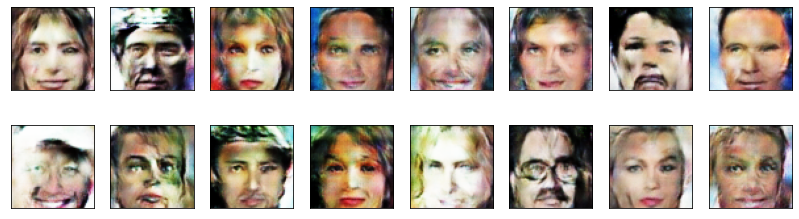

2023-06-03 22:25:26 | Epoch [18/50] | Batch 0/509 | d_loss: 0.4290 | g_loss: 3.7064
2023-06-03 22:25:27 | Epoch [18/50] | Batch 5/509 | d_loss: 0.4578 | g_loss: 3.7887
2023-06-03 22:25:29 | Epoch [18/50] | Batch 10/509 | d_loss: 0.7280 | g_loss: 3.1085
2023-06-03 22:25:31 | Epoch [18/50] | Batch 15/509 | d_loss: 0.4467 | g_loss: 4.8230
2023-06-03 22:25:32 | Epoch [18/50] | Batch 20/509 | d_loss: 0.3816 | g_loss: 4.3672
2023-06-03 22:25:34 | Epoch [18/50] | Batch 25/509 | d_loss: 0.4187 | g_loss: 4.3320
2023-06-03 22:25:35 | Epoch [18/50] | Batch 30/509 | d_loss: 0.5301 | g_loss: 4.0987
2023-06-03 22:25:37 | Epoch [18/50] | Batch 35/509 | d_loss: 0.3683 | g_loss: 3.5902
2023-06-03 22:25:39 | Epoch [18/50] | Batch 40/509 | d_loss: 0.4324 | g_loss: 5.5643
2023-06-03 22:25:40 | Epoch [18/50] | Batch 45/509 | d_loss: 0.5726 | g_loss: 4.7050
2023-06-03 22:25:42 | Epoch [18/50] | Batch 50/509 | d_loss: 0.3595 | g_loss: 4.4432
2023-06-03 22:25:44 | Epoch [18/50] | Batch 55/509 | d_loss: 0.6392

2023-06-03 22:28:03 | Epoch [18/50] | Batch 480/509 | d_loss: 0.3801 | g_loss: 3.1341
2023-06-03 22:28:05 | Epoch [18/50] | Batch 485/509 | d_loss: 0.3992 | g_loss: 3.4607
2023-06-03 22:28:06 | Epoch [18/50] | Batch 490/509 | d_loss: 0.5194 | g_loss: 5.7291
2023-06-03 22:28:08 | Epoch [18/50] | Batch 495/509 | d_loss: 1.4321 | g_loss: 5.9151
2023-06-03 22:28:09 | Epoch [18/50] | Batch 500/509 | d_loss: 0.4948 | g_loss: 4.8307
2023-06-03 22:28:11 | Epoch [18/50] | Batch 505/509 | d_loss: 0.5355 | g_loss: 3.4948


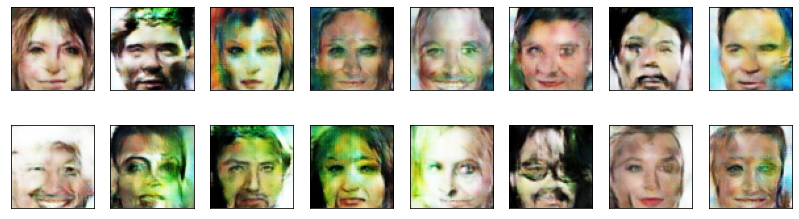

2023-06-03 22:28:13 | Epoch [19/50] | Batch 0/509 | d_loss: 0.5990 | g_loss: 3.5142
2023-06-03 22:28:15 | Epoch [19/50] | Batch 5/509 | d_loss: 0.4638 | g_loss: 3.9056
2023-06-03 22:28:17 | Epoch [19/50] | Batch 10/509 | d_loss: 0.4045 | g_loss: 3.7444
2023-06-03 22:28:18 | Epoch [19/50] | Batch 15/509 | d_loss: 0.4398 | g_loss: 3.2347
2023-06-03 22:28:20 | Epoch [19/50] | Batch 20/509 | d_loss: 0.4987 | g_loss: 4.0636
2023-06-03 22:28:22 | Epoch [19/50] | Batch 25/509 | d_loss: 0.3935 | g_loss: 3.6147
2023-06-03 22:28:23 | Epoch [19/50] | Batch 30/509 | d_loss: 0.4171 | g_loss: 3.1964
2023-06-03 22:28:25 | Epoch [19/50] | Batch 35/509 | d_loss: 0.4873 | g_loss: 4.5545
2023-06-03 22:28:27 | Epoch [19/50] | Batch 40/509 | d_loss: 0.6252 | g_loss: 3.9960
2023-06-03 22:28:28 | Epoch [19/50] | Batch 45/509 | d_loss: 0.6521 | g_loss: 4.9824
2023-06-03 22:28:30 | Epoch [19/50] | Batch 50/509 | d_loss: 0.3664 | g_loss: 4.6689
2023-06-03 22:28:31 | Epoch [19/50] | Batch 55/509 | d_loss: 0.3772

2023-06-03 22:30:51 | Epoch [19/50] | Batch 480/509 | d_loss: 0.3861 | g_loss: 5.3978
2023-06-03 22:30:53 | Epoch [19/50] | Batch 485/509 | d_loss: 0.3472 | g_loss: 5.3729
2023-06-03 22:30:54 | Epoch [19/50] | Batch 490/509 | d_loss: 0.5468 | g_loss: 4.7835
2023-06-03 22:30:56 | Epoch [19/50] | Batch 495/509 | d_loss: 0.4243 | g_loss: 4.4318
2023-06-03 22:30:57 | Epoch [19/50] | Batch 500/509 | d_loss: 0.4419 | g_loss: 3.7827
2023-06-03 22:30:59 | Epoch [19/50] | Batch 505/509 | d_loss: 0.4904 | g_loss: 5.5194


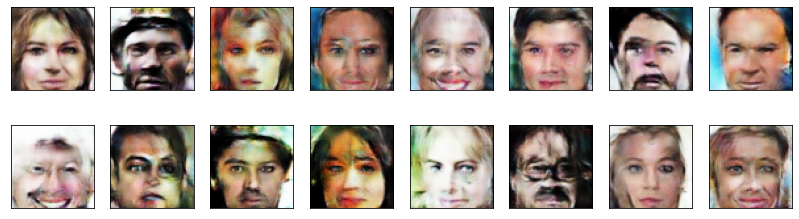

2023-06-03 22:31:02 | Epoch [20/50] | Batch 0/509 | d_loss: 0.3779 | g_loss: 4.2449
2023-06-03 22:31:03 | Epoch [20/50] | Batch 5/509 | d_loss: 0.3586 | g_loss: 4.4018
2023-06-03 22:31:05 | Epoch [20/50] | Batch 10/509 | d_loss: 0.3733 | g_loss: 3.7802
2023-06-03 22:31:07 | Epoch [20/50] | Batch 15/509 | d_loss: 0.3839 | g_loss: 4.0211
2023-06-03 22:31:08 | Epoch [20/50] | Batch 20/509 | d_loss: 0.3502 | g_loss: 4.7841
2023-06-03 22:31:10 | Epoch [20/50] | Batch 25/509 | d_loss: 0.4557 | g_loss: 6.0582
2023-06-03 22:31:11 | Epoch [20/50] | Batch 30/509 | d_loss: 0.3857 | g_loss: 3.2032
2023-06-03 22:31:13 | Epoch [20/50] | Batch 35/509 | d_loss: 0.4113 | g_loss: 4.2335
2023-06-03 22:31:15 | Epoch [20/50] | Batch 40/509 | d_loss: 0.3564 | g_loss: 5.1572
2023-06-03 22:31:16 | Epoch [20/50] | Batch 45/509 | d_loss: 0.3907 | g_loss: 3.5611
2023-06-03 22:31:18 | Epoch [20/50] | Batch 50/509 | d_loss: 0.3582 | g_loss: 5.0333
2023-06-03 22:31:20 | Epoch [20/50] | Batch 55/509 | d_loss: 0.4176

2023-06-03 22:33:39 | Epoch [20/50] | Batch 480/509 | d_loss: 0.4239 | g_loss: 3.1007
2023-06-03 22:33:41 | Epoch [20/50] | Batch 485/509 | d_loss: 0.4423 | g_loss: 4.2038
2023-06-03 22:33:42 | Epoch [20/50] | Batch 490/509 | d_loss: 0.4324 | g_loss: 2.8818
2023-06-03 22:33:44 | Epoch [20/50] | Batch 495/509 | d_loss: 0.4164 | g_loss: 3.3102
2023-06-03 22:33:46 | Epoch [20/50] | Batch 500/509 | d_loss: 0.7664 | g_loss: 6.9482
2023-06-03 22:33:47 | Epoch [20/50] | Batch 505/509 | d_loss: 1.1558 | g_loss: 2.6871


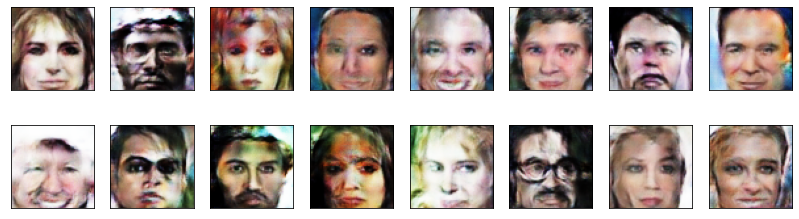

2023-06-03 22:33:50 | Epoch [21/50] | Batch 0/509 | d_loss: 0.9198 | g_loss: 4.3508
2023-06-03 22:33:51 | Epoch [21/50] | Batch 5/509 | d_loss: 0.6610 | g_loss: 4.3705
2023-06-03 22:33:53 | Epoch [21/50] | Batch 10/509 | d_loss: 0.9781 | g_loss: 4.9217
2023-06-03 22:33:55 | Epoch [21/50] | Batch 15/509 | d_loss: 0.4872 | g_loss: 3.1746
2023-06-03 22:33:56 | Epoch [21/50] | Batch 20/509 | d_loss: 0.4049 | g_loss: 3.9503
2023-06-03 22:33:58 | Epoch [21/50] | Batch 25/509 | d_loss: 0.5723 | g_loss: 4.2597
2023-06-03 22:34:00 | Epoch [21/50] | Batch 30/509 | d_loss: 0.4449 | g_loss: 2.5668
2023-06-03 22:34:01 | Epoch [21/50] | Batch 35/509 | d_loss: 0.4339 | g_loss: 3.3884
2023-06-03 22:34:03 | Epoch [21/50] | Batch 40/509 | d_loss: 0.4511 | g_loss: 3.1379
2023-06-03 22:34:05 | Epoch [21/50] | Batch 45/509 | d_loss: 0.3848 | g_loss: 3.9491
2023-06-03 22:34:06 | Epoch [21/50] | Batch 50/509 | d_loss: 0.4306 | g_loss: 3.4314
2023-06-03 22:34:08 | Epoch [21/50] | Batch 55/509 | d_loss: 0.4005

2023-06-03 22:36:27 | Epoch [21/50] | Batch 480/509 | d_loss: 0.3591 | g_loss: 6.0509
2023-06-03 22:36:29 | Epoch [21/50] | Batch 485/509 | d_loss: 0.4182 | g_loss: 5.4056
2023-06-03 22:36:31 | Epoch [21/50] | Batch 490/509 | d_loss: 0.4655 | g_loss: 3.0367
2023-06-03 22:36:32 | Epoch [21/50] | Batch 495/509 | d_loss: 0.4845 | g_loss: 4.2482
2023-06-03 22:36:34 | Epoch [21/50] | Batch 500/509 | d_loss: 0.4175 | g_loss: 4.2377
2023-06-03 22:36:35 | Epoch [21/50] | Batch 505/509 | d_loss: 0.3987 | g_loss: 4.7050


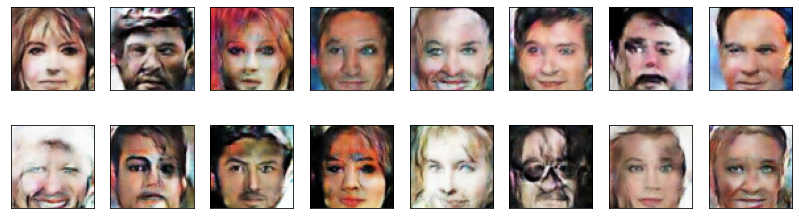

2023-06-03 22:36:38 | Epoch [22/50] | Batch 0/509 | d_loss: 0.4363 | g_loss: 6.0325
2023-06-03 22:36:40 | Epoch [22/50] | Batch 5/509 | d_loss: 0.3658 | g_loss: 4.4481
2023-06-03 22:36:41 | Epoch [22/50] | Batch 10/509 | d_loss: 0.3530 | g_loss: 5.2519
2023-06-03 22:36:43 | Epoch [22/50] | Batch 15/509 | d_loss: 0.3637 | g_loss: 3.4063
2023-06-03 22:36:45 | Epoch [22/50] | Batch 20/509 | d_loss: 0.3487 | g_loss: 7.1607
2023-06-03 22:36:46 | Epoch [22/50] | Batch 25/509 | d_loss: 0.3577 | g_loss: 5.5563
2023-06-03 22:36:48 | Epoch [22/50] | Batch 30/509 | d_loss: 0.3582 | g_loss: 8.2825
2023-06-03 22:36:50 | Epoch [22/50] | Batch 35/509 | d_loss: 0.5363 | g_loss: 3.4431
2023-06-03 22:36:51 | Epoch [22/50] | Batch 40/509 | d_loss: 0.7558 | g_loss: 4.1178
2023-06-03 22:36:53 | Epoch [22/50] | Batch 45/509 | d_loss: 0.5126 | g_loss: 2.4543
2023-06-03 22:36:54 | Epoch [22/50] | Batch 50/509 | d_loss: 0.3955 | g_loss: 5.0676
2023-06-03 22:36:56 | Epoch [22/50] | Batch 55/509 | d_loss: 0.5886

2023-06-03 22:39:15 | Epoch [22/50] | Batch 480/509 | d_loss: 0.3809 | g_loss: 5.0160
2023-06-03 22:39:17 | Epoch [22/50] | Batch 485/509 | d_loss: 0.3612 | g_loss: 4.8017
2023-06-03 22:39:19 | Epoch [22/50] | Batch 490/509 | d_loss: 0.4013 | g_loss: 4.0628
2023-06-03 22:39:20 | Epoch [22/50] | Batch 495/509 | d_loss: 0.3917 | g_loss: 3.7551
2023-06-03 22:39:22 | Epoch [22/50] | Batch 500/509 | d_loss: 0.8708 | g_loss: 4.1695
2023-06-03 22:39:24 | Epoch [22/50] | Batch 505/509 | d_loss: 0.4163 | g_loss: 3.2022


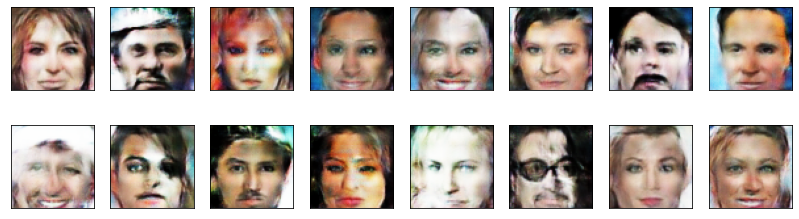

2023-06-03 22:39:26 | Epoch [23/50] | Batch 0/509 | d_loss: 0.4127 | g_loss: 3.3601
2023-06-03 22:39:28 | Epoch [23/50] | Batch 5/509 | d_loss: 0.3684 | g_loss: 4.8531
2023-06-03 22:39:29 | Epoch [23/50] | Batch 10/509 | d_loss: 0.3864 | g_loss: 3.1917
2023-06-03 22:39:31 | Epoch [23/50] | Batch 15/509 | d_loss: 0.4045 | g_loss: 3.9669
2023-06-03 22:39:33 | Epoch [23/50] | Batch 20/509 | d_loss: 0.4258 | g_loss: 3.9728
2023-06-03 22:39:34 | Epoch [23/50] | Batch 25/509 | d_loss: 0.3840 | g_loss: 3.6981
2023-06-03 22:39:36 | Epoch [23/50] | Batch 30/509 | d_loss: 0.3548 | g_loss: 4.5158
2023-06-03 22:39:37 | Epoch [23/50] | Batch 35/509 | d_loss: 0.4356 | g_loss: 2.6670
2023-06-03 22:39:39 | Epoch [23/50] | Batch 40/509 | d_loss: 0.6752 | g_loss: 5.3514
2023-06-03 22:39:41 | Epoch [23/50] | Batch 45/509 | d_loss: 0.3675 | g_loss: 4.4649
2023-06-03 22:39:42 | Epoch [23/50] | Batch 50/509 | d_loss: 0.3629 | g_loss: 5.0667
2023-06-03 22:39:44 | Epoch [23/50] | Batch 55/509 | d_loss: 0.3747

2023-06-03 22:42:03 | Epoch [23/50] | Batch 480/509 | d_loss: 0.3570 | g_loss: 6.3932
2023-06-03 22:42:05 | Epoch [23/50] | Batch 485/509 | d_loss: 0.3728 | g_loss: 5.2153
2023-06-03 22:42:06 | Epoch [23/50] | Batch 490/509 | d_loss: 0.4015 | g_loss: 3.3479
2023-06-03 22:42:08 | Epoch [23/50] | Batch 495/509 | d_loss: 0.4041 | g_loss: 4.3234
2023-06-03 22:42:10 | Epoch [23/50] | Batch 500/509 | d_loss: 0.4173 | g_loss: 4.1105
2023-06-03 22:42:11 | Epoch [23/50] | Batch 505/509 | d_loss: 0.3586 | g_loss: 4.0059


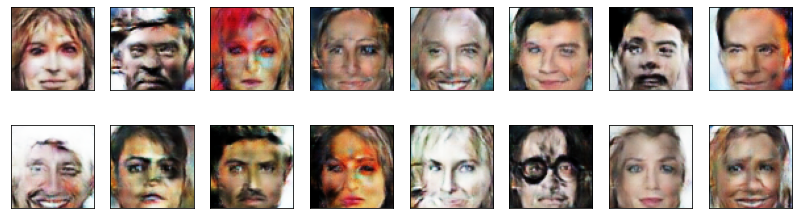

2023-06-03 22:42:14 | Epoch [24/50] | Batch 0/509 | d_loss: 0.3868 | g_loss: 3.2679
2023-06-03 22:42:15 | Epoch [24/50] | Batch 5/509 | d_loss: 0.3669 | g_loss: 4.7089
2023-06-03 22:42:17 | Epoch [24/50] | Batch 10/509 | d_loss: 0.3691 | g_loss: 4.4949
2023-06-03 22:42:19 | Epoch [24/50] | Batch 15/509 | d_loss: 0.4264 | g_loss: 3.9933
2023-06-03 22:42:20 | Epoch [24/50] | Batch 20/509 | d_loss: 0.4160 | g_loss: 4.3623
2023-06-03 22:42:22 | Epoch [24/50] | Batch 25/509 | d_loss: 1.7424 | g_loss: 8.8952
2023-06-03 22:42:24 | Epoch [24/50] | Batch 30/509 | d_loss: 0.5122 | g_loss: 2.4551
2023-06-03 22:42:25 | Epoch [24/50] | Batch 35/509 | d_loss: 0.4807 | g_loss: 2.9842
2023-06-03 22:42:27 | Epoch [24/50] | Batch 40/509 | d_loss: 0.4121 | g_loss: 3.7733
2023-06-03 22:42:29 | Epoch [24/50] | Batch 45/509 | d_loss: 0.8722 | g_loss: 3.9392
2023-06-03 22:42:30 | Epoch [24/50] | Batch 50/509 | d_loss: 0.3980 | g_loss: 4.3161
2023-06-03 22:42:32 | Epoch [24/50] | Batch 55/509 | d_loss: 0.4526

2023-06-03 22:44:51 | Epoch [24/50] | Batch 480/509 | d_loss: 0.3807 | g_loss: 4.4956
2023-06-03 22:44:53 | Epoch [24/50] | Batch 485/509 | d_loss: 0.4264 | g_loss: 4.9230
2023-06-03 22:44:54 | Epoch [24/50] | Batch 490/509 | d_loss: 0.3848 | g_loss: 3.7444
2023-06-03 22:44:56 | Epoch [24/50] | Batch 495/509 | d_loss: 0.4325 | g_loss: 2.9810
2023-06-03 22:44:58 | Epoch [24/50] | Batch 500/509 | d_loss: 0.3567 | g_loss: 4.3161
2023-06-03 22:44:59 | Epoch [24/50] | Batch 505/509 | d_loss: 0.3605 | g_loss: 3.6523


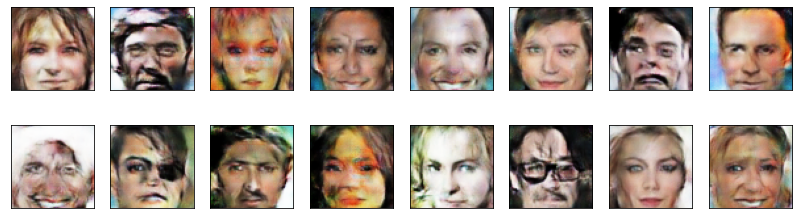

2023-06-03 22:45:02 | Epoch [25/50] | Batch 0/509 | d_loss: 0.4138 | g_loss: 4.6446
2023-06-03 22:45:03 | Epoch [25/50] | Batch 5/509 | d_loss: 0.4343 | g_loss: 4.7745
2023-06-03 22:45:05 | Epoch [25/50] | Batch 10/509 | d_loss: 0.3770 | g_loss: 5.3223
2023-06-03 22:45:07 | Epoch [25/50] | Batch 15/509 | d_loss: 1.0859 | g_loss: 6.7523
2023-06-03 22:45:08 | Epoch [25/50] | Batch 20/509 | d_loss: 0.3959 | g_loss: 3.9214
2023-06-03 22:45:10 | Epoch [25/50] | Batch 25/509 | d_loss: 0.3764 | g_loss: 4.4396
2023-06-03 22:45:12 | Epoch [25/50] | Batch 30/509 | d_loss: 0.3967 | g_loss: 4.4426
2023-06-03 22:45:13 | Epoch [25/50] | Batch 35/509 | d_loss: 0.4001 | g_loss: 4.2205
2023-06-03 22:45:15 | Epoch [25/50] | Batch 40/509 | d_loss: 0.6507 | g_loss: 4.8132
2023-06-03 22:45:17 | Epoch [25/50] | Batch 45/509 | d_loss: 0.3777 | g_loss: 5.1497
2023-06-03 22:45:18 | Epoch [25/50] | Batch 50/509 | d_loss: 0.3615 | g_loss: 4.6082
2023-06-03 22:45:20 | Epoch [25/50] | Batch 55/509 | d_loss: 0.4083

2023-06-03 22:47:39 | Epoch [25/50] | Batch 480/509 | d_loss: 0.3746 | g_loss: 4.4698
2023-06-03 22:47:41 | Epoch [25/50] | Batch 485/509 | d_loss: 0.4023 | g_loss: 3.8518
2023-06-03 22:47:42 | Epoch [25/50] | Batch 490/509 | d_loss: 0.3729 | g_loss: 5.3803
2023-06-03 22:47:44 | Epoch [25/50] | Batch 495/509 | d_loss: 0.5200 | g_loss: 3.6946
2023-06-03 22:47:45 | Epoch [25/50] | Batch 500/509 | d_loss: 0.3851 | g_loss: 3.6425
2023-06-03 22:47:47 | Epoch [25/50] | Batch 505/509 | d_loss: 0.4047 | g_loss: 3.9039


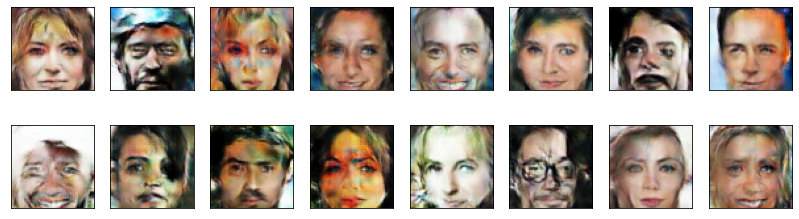

2023-06-03 22:47:50 | Epoch [26/50] | Batch 0/509 | d_loss: 0.3629 | g_loss: 4.8346
2023-06-03 22:47:51 | Epoch [26/50] | Batch 5/509 | d_loss: 0.3788 | g_loss: 4.4020
2023-06-03 22:47:53 | Epoch [26/50] | Batch 10/509 | d_loss: 0.4128 | g_loss: 3.8834
2023-06-03 22:47:55 | Epoch [26/50] | Batch 15/509 | d_loss: 0.3693 | g_loss: 4.5255
2023-06-03 22:47:56 | Epoch [26/50] | Batch 20/509 | d_loss: 0.4001 | g_loss: 4.2233
2023-06-03 22:47:58 | Epoch [26/50] | Batch 25/509 | d_loss: 0.8905 | g_loss: 6.6554
2023-06-03 22:48:00 | Epoch [26/50] | Batch 30/509 | d_loss: 0.5040 | g_loss: 2.4255
2023-06-03 22:48:01 | Epoch [26/50] | Batch 35/509 | d_loss: 0.3841 | g_loss: 4.2451
2023-06-03 22:48:03 | Epoch [26/50] | Batch 40/509 | d_loss: 0.3993 | g_loss: 3.8679
2023-06-03 22:48:04 | Epoch [26/50] | Batch 45/509 | d_loss: 0.4091 | g_loss: 3.2426
2023-06-03 22:48:06 | Epoch [26/50] | Batch 50/509 | d_loss: 0.3876 | g_loss: 4.1097
2023-06-03 22:48:08 | Epoch [26/50] | Batch 55/509 | d_loss: 0.4937

2023-06-03 22:50:27 | Epoch [26/50] | Batch 480/509 | d_loss: 0.3875 | g_loss: 3.9276
2023-06-03 22:50:29 | Epoch [26/50] | Batch 485/509 | d_loss: 0.4497 | g_loss: 5.1750
2023-06-03 22:50:30 | Epoch [26/50] | Batch 490/509 | d_loss: 0.4254 | g_loss: 3.1525
2023-06-03 22:50:32 | Epoch [26/50] | Batch 495/509 | d_loss: 0.4103 | g_loss: 3.0290
2023-06-03 22:50:34 | Epoch [26/50] | Batch 500/509 | d_loss: 0.3698 | g_loss: 4.8531
2023-06-03 22:50:35 | Epoch [26/50] | Batch 505/509 | d_loss: 0.4462 | g_loss: 4.6067


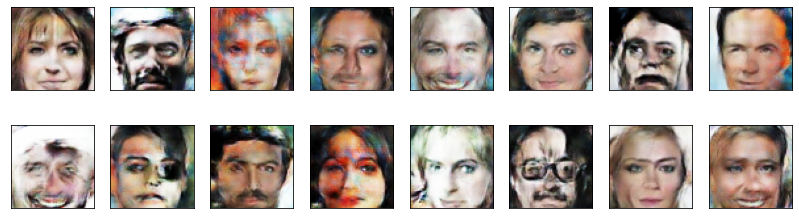

2023-06-03 22:50:38 | Epoch [27/50] | Batch 0/509 | d_loss: 0.3594 | g_loss: 4.1481
2023-06-03 22:50:39 | Epoch [27/50] | Batch 5/509 | d_loss: 0.3601 | g_loss: 4.7239
2023-06-03 22:50:41 | Epoch [27/50] | Batch 10/509 | d_loss: 1.3477 | g_loss: 9.4124
2023-06-03 22:50:43 | Epoch [27/50] | Batch 15/509 | d_loss: 0.6787 | g_loss: 2.1496
2023-06-03 22:50:44 | Epoch [27/50] | Batch 20/509 | d_loss: 0.4008 | g_loss: 4.0180
2023-06-03 22:50:46 | Epoch [27/50] | Batch 25/509 | d_loss: 0.3898 | g_loss: 3.8762
2023-06-03 22:50:48 | Epoch [27/50] | Batch 30/509 | d_loss: 0.4216 | g_loss: 6.0507
2023-06-03 22:50:49 | Epoch [27/50] | Batch 35/509 | d_loss: 0.4709 | g_loss: 3.8625
2023-06-03 22:50:51 | Epoch [27/50] | Batch 40/509 | d_loss: 0.5023 | g_loss: 2.4139
2023-06-03 22:50:52 | Epoch [27/50] | Batch 45/509 | d_loss: 0.4044 | g_loss: 4.5486
2023-06-03 22:50:54 | Epoch [27/50] | Batch 50/509 | d_loss: 0.3562 | g_loss: 4.4591
2023-06-03 22:50:56 | Epoch [27/50] | Batch 55/509 | d_loss: 0.4174

2023-06-03 22:53:15 | Epoch [27/50] | Batch 480/509 | d_loss: 0.5046 | g_loss: 1.9438
2023-06-03 22:53:17 | Epoch [27/50] | Batch 485/509 | d_loss: 0.5407 | g_loss: 2.5214
2023-06-03 22:53:18 | Epoch [27/50] | Batch 490/509 | d_loss: 0.5122 | g_loss: 3.1675
2023-06-03 22:53:20 | Epoch [27/50] | Batch 495/509 | d_loss: 0.4361 | g_loss: 4.0477
2023-06-03 22:53:21 | Epoch [27/50] | Batch 500/509 | d_loss: 0.3978 | g_loss: 4.6801
2023-06-03 22:53:23 | Epoch [27/50] | Batch 505/509 | d_loss: 0.4043 | g_loss: 3.7679


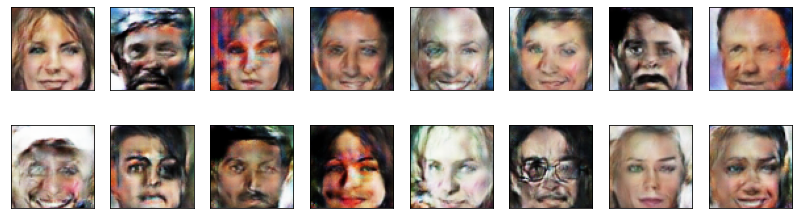

2023-06-03 22:53:25 | Epoch [28/50] | Batch 0/509 | d_loss: 0.3733 | g_loss: 4.7158
2023-06-03 22:53:27 | Epoch [28/50] | Batch 5/509 | d_loss: 0.3874 | g_loss: 4.9384
2023-06-03 22:53:29 | Epoch [28/50] | Batch 10/509 | d_loss: 0.3893 | g_loss: 4.0550
2023-06-03 22:53:30 | Epoch [28/50] | Batch 15/509 | d_loss: 0.3812 | g_loss: 3.7751
2023-06-03 22:53:32 | Epoch [28/50] | Batch 20/509 | d_loss: 0.3848 | g_loss: 4.3727
2023-06-03 22:53:34 | Epoch [28/50] | Batch 25/509 | d_loss: 0.3635 | g_loss: 4.7984
2023-06-03 22:53:35 | Epoch [28/50] | Batch 30/509 | d_loss: 0.3795 | g_loss: 4.3791
2023-06-03 22:53:37 | Epoch [28/50] | Batch 35/509 | d_loss: 0.4401 | g_loss: 3.6867
2023-06-03 22:53:39 | Epoch [28/50] | Batch 40/509 | d_loss: 0.4189 | g_loss: 4.1780
2023-06-03 22:53:40 | Epoch [28/50] | Batch 45/509 | d_loss: 0.5424 | g_loss: 4.5838
2023-06-03 22:53:42 | Epoch [28/50] | Batch 50/509 | d_loss: 0.3978 | g_loss: 3.7152
2023-06-03 22:53:44 | Epoch [28/50] | Batch 55/509 | d_loss: 0.4595

2023-06-03 22:56:03 | Epoch [28/50] | Batch 480/509 | d_loss: 0.3800 | g_loss: 4.1005
2023-06-03 22:56:05 | Epoch [28/50] | Batch 485/509 | d_loss: 0.3703 | g_loss: 4.2512
2023-06-03 22:56:06 | Epoch [28/50] | Batch 490/509 | d_loss: 0.3665 | g_loss: 3.9070
2023-06-03 22:56:08 | Epoch [28/50] | Batch 495/509 | d_loss: 0.4016 | g_loss: 5.0498
2023-06-03 22:56:10 | Epoch [28/50] | Batch 500/509 | d_loss: 0.3533 | g_loss: 4.4921
2023-06-03 22:56:11 | Epoch [28/50] | Batch 505/509 | d_loss: 0.4457 | g_loss: 4.5920


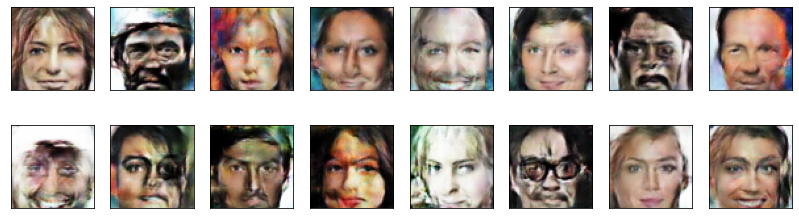

2023-06-03 22:56:14 | Epoch [29/50] | Batch 0/509 | d_loss: 0.3817 | g_loss: 5.5472
2023-06-03 22:56:15 | Epoch [29/50] | Batch 5/509 | d_loss: 0.4297 | g_loss: 3.9801
2023-06-03 22:56:17 | Epoch [29/50] | Batch 10/509 | d_loss: 0.4099 | g_loss: 4.1047
2023-06-03 22:56:19 | Epoch [29/50] | Batch 15/509 | d_loss: 0.4010 | g_loss: 3.4954
2023-06-03 22:56:20 | Epoch [29/50] | Batch 20/509 | d_loss: 0.3776 | g_loss: 5.0064
2023-06-03 22:56:22 | Epoch [29/50] | Batch 25/509 | d_loss: 0.3766 | g_loss: 4.3252
2023-06-03 22:56:24 | Epoch [29/50] | Batch 30/509 | d_loss: 0.3461 | g_loss: 5.8989
2023-06-03 22:56:25 | Epoch [29/50] | Batch 35/509 | d_loss: 0.4792 | g_loss: 4.0567
2023-06-03 22:56:27 | Epoch [29/50] | Batch 40/509 | d_loss: 0.5630 | g_loss: 3.5577
2023-06-03 22:56:29 | Epoch [29/50] | Batch 45/509 | d_loss: 0.4847 | g_loss: 4.7778
2023-06-03 22:56:30 | Epoch [29/50] | Batch 50/509 | d_loss: 0.5336 | g_loss: 2.5203
2023-06-03 22:56:32 | Epoch [29/50] | Batch 55/509 | d_loss: 0.4066

2023-06-03 22:58:51 | Epoch [29/50] | Batch 480/509 | d_loss: 0.3667 | g_loss: 5.9094
2023-06-03 22:58:53 | Epoch [29/50] | Batch 485/509 | d_loss: 1.3766 | g_loss: 7.7216
2023-06-03 22:58:54 | Epoch [29/50] | Batch 490/509 | d_loss: 0.4469 | g_loss: 4.2691
2023-06-03 22:58:56 | Epoch [29/50] | Batch 495/509 | d_loss: 0.5634 | g_loss: 1.9138
2023-06-03 22:58:58 | Epoch [29/50] | Batch 500/509 | d_loss: 0.6372 | g_loss: 2.9826
2023-06-03 22:58:59 | Epoch [29/50] | Batch 505/509 | d_loss: 0.7434 | g_loss: 1.6236


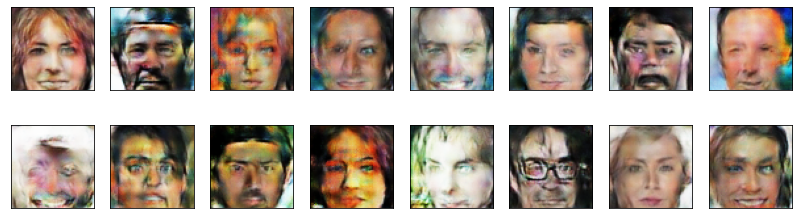

2023-06-03 22:59:02 | Epoch [30/50] | Batch 0/509 | d_loss: 0.6282 | g_loss: 3.5038
2023-06-03 22:59:03 | Epoch [30/50] | Batch 5/509 | d_loss: 0.5437 | g_loss: 3.0465
2023-06-03 22:59:05 | Epoch [30/50] | Batch 10/509 | d_loss: 0.4995 | g_loss: 4.1734
2023-06-03 22:59:07 | Epoch [30/50] | Batch 15/509 | d_loss: 0.5864 | g_loss: 2.9144
2023-06-03 22:59:08 | Epoch [30/50] | Batch 20/509 | d_loss: 0.3789 | g_loss: 5.2057
2023-06-03 22:59:10 | Epoch [30/50] | Batch 25/509 | d_loss: 0.7993 | g_loss: 4.8797
2023-06-03 22:59:12 | Epoch [30/50] | Batch 30/509 | d_loss: 0.4804 | g_loss: 4.3742
2023-06-03 22:59:13 | Epoch [30/50] | Batch 35/509 | d_loss: 0.4226 | g_loss: 3.6286
2023-06-03 22:59:15 | Epoch [30/50] | Batch 40/509 | d_loss: 0.4105 | g_loss: 4.5169
2023-06-03 22:59:17 | Epoch [30/50] | Batch 45/509 | d_loss: 0.4431 | g_loss: 3.4547
2023-06-03 22:59:18 | Epoch [30/50] | Batch 50/509 | d_loss: 0.3827 | g_loss: 3.9008
2023-06-03 22:59:20 | Epoch [30/50] | Batch 55/509 | d_loss: 0.4856

2023-06-03 23:01:39 | Epoch [30/50] | Batch 480/509 | d_loss: 0.4079 | g_loss: 7.1202
2023-06-03 23:01:41 | Epoch [30/50] | Batch 485/509 | d_loss: 0.3911 | g_loss: 3.3220
2023-06-03 23:01:42 | Epoch [30/50] | Batch 490/509 | d_loss: 0.3623 | g_loss: 5.2953
2023-06-03 23:01:44 | Epoch [30/50] | Batch 495/509 | d_loss: 0.3799 | g_loss: 4.4435
2023-06-03 23:01:46 | Epoch [30/50] | Batch 500/509 | d_loss: 0.3778 | g_loss: 5.1669
2023-06-03 23:01:47 | Epoch [30/50] | Batch 505/509 | d_loss: 1.0767 | g_loss: 1.0145


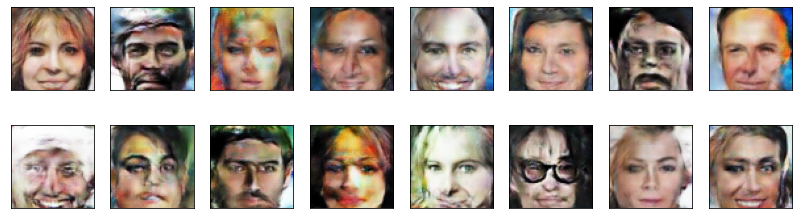

2023-06-03 23:01:50 | Epoch [31/50] | Batch 0/509 | d_loss: 0.5592 | g_loss: 4.7942
2023-06-03 23:01:52 | Epoch [31/50] | Batch 5/509 | d_loss: 0.4171 | g_loss: 3.1538
2023-06-03 23:01:53 | Epoch [31/50] | Batch 10/509 | d_loss: 0.3887 | g_loss: 3.8785
2023-06-03 23:01:55 | Epoch [31/50] | Batch 15/509 | d_loss: 0.3902 | g_loss: 4.3118
2023-06-03 23:01:56 | Epoch [31/50] | Batch 20/509 | d_loss: 0.3702 | g_loss: 4.0077
2023-06-03 23:01:58 | Epoch [31/50] | Batch 25/509 | d_loss: 0.5190 | g_loss: 3.8346
2023-06-03 23:02:00 | Epoch [31/50] | Batch 30/509 | d_loss: 0.5088 | g_loss: 3.0150
2023-06-03 23:02:01 | Epoch [31/50] | Batch 35/509 | d_loss: 0.6210 | g_loss: 5.2734
2023-06-03 23:02:03 | Epoch [31/50] | Batch 40/509 | d_loss: 0.4352 | g_loss: 5.0946
2023-06-03 23:02:05 | Epoch [31/50] | Batch 45/509 | d_loss: 0.4113 | g_loss: 4.4974
2023-06-03 23:02:06 | Epoch [31/50] | Batch 50/509 | d_loss: 0.3980 | g_loss: 4.5965
2023-06-03 23:02:08 | Epoch [31/50] | Batch 55/509 | d_loss: 0.3570

2023-06-03 23:04:27 | Epoch [31/50] | Batch 480/509 | d_loss: 0.5332 | g_loss: 3.3969
2023-06-03 23:04:29 | Epoch [31/50] | Batch 485/509 | d_loss: 0.5728 | g_loss: 2.2925
2023-06-03 23:04:30 | Epoch [31/50] | Batch 490/509 | d_loss: 0.4157 | g_loss: 6.1911
2023-06-03 23:04:32 | Epoch [31/50] | Batch 495/509 | d_loss: 0.5205 | g_loss: 1.9602
2023-06-03 23:04:34 | Epoch [31/50] | Batch 500/509 | d_loss: 0.5854 | g_loss: 4.9669
2023-06-03 23:04:35 | Epoch [31/50] | Batch 505/509 | d_loss: 0.3897 | g_loss: 4.1225


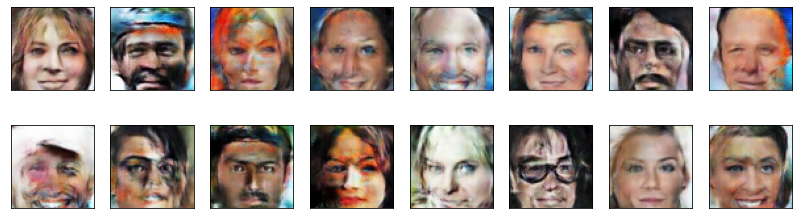

2023-06-03 23:04:38 | Epoch [32/50] | Batch 0/509 | d_loss: 0.3778 | g_loss: 3.5610
2023-06-03 23:04:39 | Epoch [32/50] | Batch 5/509 | d_loss: 0.4247 | g_loss: 3.2407
2023-06-03 23:04:41 | Epoch [32/50] | Batch 10/509 | d_loss: 0.3712 | g_loss: 4.8820
2023-06-03 23:04:43 | Epoch [32/50] | Batch 15/509 | d_loss: 0.3886 | g_loss: 5.3733
2023-06-03 23:04:44 | Epoch [32/50] | Batch 20/509 | d_loss: 0.4531 | g_loss: 3.6683
2023-06-03 23:04:46 | Epoch [32/50] | Batch 25/509 | d_loss: 0.5033 | g_loss: 4.7185
2023-06-03 23:04:48 | Epoch [32/50] | Batch 30/509 | d_loss: 0.4545 | g_loss: 3.8548
2023-06-03 23:04:49 | Epoch [32/50] | Batch 35/509 | d_loss: 0.4081 | g_loss: 5.1737
2023-06-03 23:04:51 | Epoch [32/50] | Batch 40/509 | d_loss: 0.4616 | g_loss: 3.1246
2023-06-03 23:04:52 | Epoch [32/50] | Batch 45/509 | d_loss: 0.4357 | g_loss: 4.7599
2023-06-03 23:04:54 | Epoch [32/50] | Batch 50/509 | d_loss: 0.3610 | g_loss: 4.4770
2023-06-03 23:04:56 | Epoch [32/50] | Batch 55/509 | d_loss: 0.5106

2023-06-03 23:07:15 | Epoch [32/50] | Batch 480/509 | d_loss: 0.4231 | g_loss: 3.2886
2023-06-03 23:07:17 | Epoch [32/50] | Batch 485/509 | d_loss: 0.3715 | g_loss: 5.5180
2023-06-03 23:07:18 | Epoch [32/50] | Batch 490/509 | d_loss: 0.3789 | g_loss: 4.6641
2023-06-03 23:07:20 | Epoch [32/50] | Batch 495/509 | d_loss: 0.3833 | g_loss: 5.5215
2023-06-03 23:07:22 | Epoch [32/50] | Batch 500/509 | d_loss: 0.3581 | g_loss: 4.4647
2023-06-03 23:07:23 | Epoch [32/50] | Batch 505/509 | d_loss: 0.5780 | g_loss: 3.1299


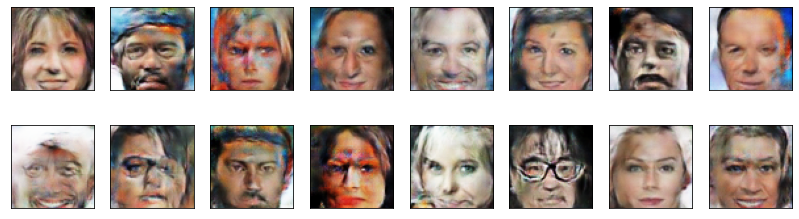

2023-06-03 23:07:26 | Epoch [33/50] | Batch 0/509 | d_loss: 0.4738 | g_loss: 4.7506
2023-06-03 23:07:27 | Epoch [33/50] | Batch 5/509 | d_loss: 0.3701 | g_loss: 4.3543
2023-06-03 23:07:29 | Epoch [33/50] | Batch 10/509 | d_loss: 0.3680 | g_loss: 3.9430
2023-06-03 23:07:31 | Epoch [33/50] | Batch 15/509 | d_loss: 0.4096 | g_loss: 4.2415
2023-06-03 23:07:32 | Epoch [33/50] | Batch 20/509 | d_loss: 0.3968 | g_loss: 4.6960
2023-06-03 23:07:34 | Epoch [33/50] | Batch 25/509 | d_loss: 0.3550 | g_loss: 5.1501
2023-06-03 23:07:36 | Epoch [33/50] | Batch 30/509 | d_loss: 0.4524 | g_loss: 3.7642
2023-06-03 23:07:37 | Epoch [33/50] | Batch 35/509 | d_loss: 1.4351 | g_loss: 1.9157
2023-06-03 23:07:39 | Epoch [33/50] | Batch 40/509 | d_loss: 0.5890 | g_loss: 1.7503
2023-06-03 23:07:40 | Epoch [33/50] | Batch 45/509 | d_loss: 0.6977 | g_loss: 2.6752
2023-06-03 23:07:42 | Epoch [33/50] | Batch 50/509 | d_loss: 0.5274 | g_loss: 3.1542
2023-06-03 23:07:44 | Epoch [33/50] | Batch 55/509 | d_loss: 0.5252

2023-06-03 23:10:03 | Epoch [33/50] | Batch 480/509 | d_loss: 0.3798 | g_loss: 4.5754
2023-06-03 23:10:05 | Epoch [33/50] | Batch 485/509 | d_loss: 0.3783 | g_loss: 4.3152
2023-06-03 23:10:06 | Epoch [33/50] | Batch 490/509 | d_loss: 0.6506 | g_loss: 5.6614
2023-06-03 23:10:08 | Epoch [33/50] | Batch 495/509 | d_loss: 0.3791 | g_loss: 4.7080
2023-06-03 23:10:10 | Epoch [33/50] | Batch 500/509 | d_loss: 0.3610 | g_loss: 5.7028
2023-06-03 23:10:11 | Epoch [33/50] | Batch 505/509 | d_loss: 0.3726 | g_loss: 5.0299


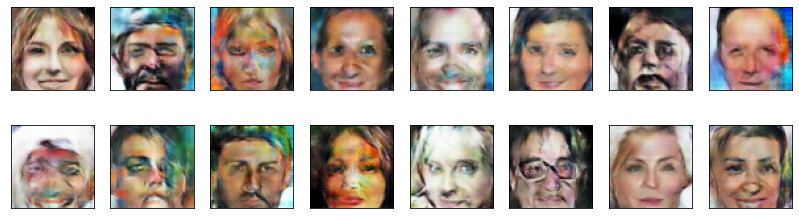

2023-06-03 23:10:14 | Epoch [34/50] | Batch 0/509 | d_loss: 0.3604 | g_loss: 5.3415
2023-06-03 23:10:15 | Epoch [34/50] | Batch 5/509 | d_loss: 0.3620 | g_loss: 5.1130
2023-06-03 23:10:17 | Epoch [34/50] | Batch 10/509 | d_loss: 0.3656 | g_loss: 4.1398
2023-06-03 23:10:19 | Epoch [34/50] | Batch 15/509 | d_loss: 0.3768 | g_loss: 5.0433
2023-06-03 23:10:20 | Epoch [34/50] | Batch 20/509 | d_loss: 0.4300 | g_loss: 4.3766
2023-06-03 23:10:22 | Epoch [34/50] | Batch 25/509 | d_loss: 0.3502 | g_loss: 5.8471
2023-06-03 23:10:23 | Epoch [34/50] | Batch 30/509 | d_loss: 0.3609 | g_loss: 4.9726
2023-06-03 23:10:25 | Epoch [34/50] | Batch 35/509 | d_loss: 0.3777 | g_loss: 5.7743
2023-06-03 23:10:27 | Epoch [34/50] | Batch 40/509 | d_loss: 0.4154 | g_loss: 3.8698
2023-06-03 23:10:28 | Epoch [34/50] | Batch 45/509 | d_loss: 0.4085 | g_loss: 3.5575
2023-06-03 23:10:30 | Epoch [34/50] | Batch 50/509 | d_loss: 0.3888 | g_loss: 4.3849
2023-06-03 23:10:32 | Epoch [34/50] | Batch 55/509 | d_loss: 0.4495

2023-06-03 23:12:51 | Epoch [34/50] | Batch 480/509 | d_loss: 0.3475 | g_loss: 5.4639
2023-06-03 23:12:53 | Epoch [34/50] | Batch 485/509 | d_loss: 0.3747 | g_loss: 3.8187
2023-06-03 23:12:54 | Epoch [34/50] | Batch 490/509 | d_loss: 0.3829 | g_loss: 5.9632
2023-06-03 23:12:56 | Epoch [34/50] | Batch 495/509 | d_loss: 0.3707 | g_loss: 4.6502
2023-06-03 23:12:58 | Epoch [34/50] | Batch 500/509 | d_loss: 0.3561 | g_loss: 4.3270
2023-06-03 23:12:59 | Epoch [34/50] | Batch 505/509 | d_loss: 0.3709 | g_loss: 4.1760


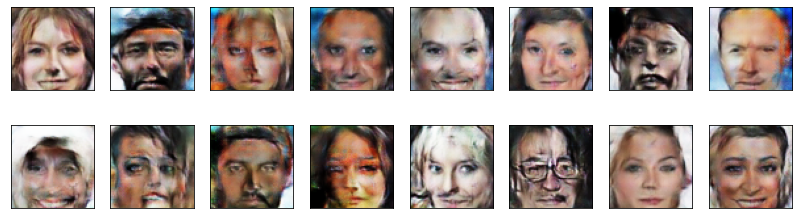

2023-06-03 23:13:02 | Epoch [35/50] | Batch 0/509 | d_loss: 0.3703 | g_loss: 5.0040
2023-06-03 23:13:03 | Epoch [35/50] | Batch 5/509 | d_loss: 0.9083 | g_loss: 8.6917
2023-06-03 23:13:05 | Epoch [35/50] | Batch 10/509 | d_loss: 0.4871 | g_loss: 3.7237
2023-06-03 23:13:07 | Epoch [35/50] | Batch 15/509 | d_loss: 1.2959 | g_loss: 5.2210
2023-06-03 23:13:08 | Epoch [35/50] | Batch 20/509 | d_loss: 0.5061 | g_loss: 4.8612
2023-06-03 23:13:10 | Epoch [35/50] | Batch 25/509 | d_loss: 0.4319 | g_loss: 3.5515
2023-06-03 23:13:12 | Epoch [35/50] | Batch 30/509 | d_loss: 0.4106 | g_loss: 4.5428
2023-06-03 23:13:13 | Epoch [35/50] | Batch 35/509 | d_loss: 0.3913 | g_loss: 4.4516
2023-06-03 23:13:15 | Epoch [35/50] | Batch 40/509 | d_loss: 0.4022 | g_loss: 3.9198
2023-06-03 23:13:17 | Epoch [35/50] | Batch 45/509 | d_loss: 0.5037 | g_loss: 5.3079
2023-06-03 23:13:18 | Epoch [35/50] | Batch 50/509 | d_loss: 0.4018 | g_loss: 3.4804
2023-06-03 23:13:20 | Epoch [35/50] | Batch 55/509 | d_loss: 0.3801

2023-06-03 23:15:39 | Epoch [35/50] | Batch 480/509 | d_loss: 0.3723 | g_loss: 4.6324
2023-06-03 23:15:41 | Epoch [35/50] | Batch 485/509 | d_loss: 0.4263 | g_loss: 4.4632
2023-06-03 23:15:42 | Epoch [35/50] | Batch 490/509 | d_loss: 0.4055 | g_loss: 4.4858
2023-06-03 23:15:44 | Epoch [35/50] | Batch 495/509 | d_loss: 0.3802 | g_loss: 4.0125
2023-06-03 23:15:46 | Epoch [35/50] | Batch 500/509 | d_loss: 0.3878 | g_loss: 3.0961
2023-06-03 23:15:47 | Epoch [35/50] | Batch 505/509 | d_loss: 0.3606 | g_loss: 6.0926


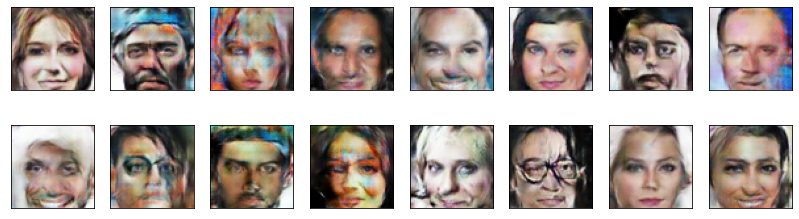

2023-06-03 23:15:50 | Epoch [36/50] | Batch 0/509 | d_loss: 0.3820 | g_loss: 4.7028
2023-06-03 23:15:51 | Epoch [36/50] | Batch 5/509 | d_loss: 0.4062 | g_loss: 5.4879
2023-06-03 23:15:53 | Epoch [36/50] | Batch 10/509 | d_loss: 0.3678 | g_loss: 4.6416
2023-06-03 23:15:55 | Epoch [36/50] | Batch 15/509 | d_loss: 0.4686 | g_loss: 2.6680
2023-06-03 23:15:56 | Epoch [36/50] | Batch 20/509 | d_loss: 0.3772 | g_loss: 4.0957
2023-06-03 23:15:58 | Epoch [36/50] | Batch 25/509 | d_loss: 0.3518 | g_loss: 6.0753
2023-06-03 23:15:59 | Epoch [36/50] | Batch 30/509 | d_loss: 0.3608 | g_loss: 5.5651
2023-06-03 23:16:01 | Epoch [36/50] | Batch 35/509 | d_loss: 0.4059 | g_loss: 4.1717
2023-06-03 23:16:03 | Epoch [36/50] | Batch 40/509 | d_loss: 0.3567 | g_loss: 5.8163
2023-06-03 23:16:04 | Epoch [36/50] | Batch 45/509 | d_loss: 0.4961 | g_loss: 2.2672
2023-06-03 23:16:06 | Epoch [36/50] | Batch 50/509 | d_loss: 0.3759 | g_loss: 4.1259
2023-06-03 23:16:08 | Epoch [36/50] | Batch 55/509 | d_loss: 0.4037

2023-06-03 23:18:27 | Epoch [36/50] | Batch 480/509 | d_loss: 0.5824 | g_loss: 2.5581
2023-06-03 23:18:29 | Epoch [36/50] | Batch 485/509 | d_loss: 0.3683 | g_loss: 4.6813
2023-06-03 23:18:30 | Epoch [36/50] | Batch 490/509 | d_loss: 0.4017 | g_loss: 3.3000
2023-06-03 23:18:32 | Epoch [36/50] | Batch 495/509 | d_loss: 0.3959 | g_loss: 4.5789
2023-06-03 23:18:34 | Epoch [36/50] | Batch 500/509 | d_loss: 0.3646 | g_loss: 5.7673
2023-06-03 23:18:35 | Epoch [36/50] | Batch 505/509 | d_loss: 0.3720 | g_loss: 5.4177


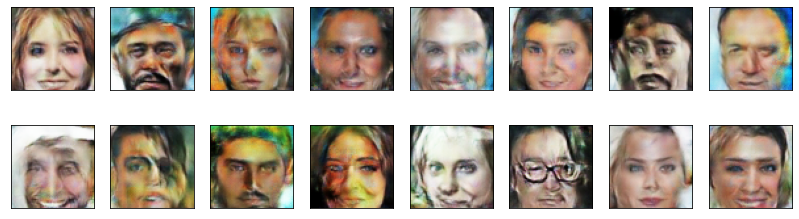

2023-06-03 23:18:38 | Epoch [37/50] | Batch 0/509 | d_loss: 0.3698 | g_loss: 5.5775
2023-06-03 23:18:39 | Epoch [37/50] | Batch 5/509 | d_loss: 0.3802 | g_loss: 4.7644
2023-06-03 23:18:41 | Epoch [37/50] | Batch 10/509 | d_loss: 0.6243 | g_loss: 5.0134
2023-06-03 23:18:43 | Epoch [37/50] | Batch 15/509 | d_loss: 0.4042 | g_loss: 3.7536
2023-06-03 23:18:44 | Epoch [37/50] | Batch 20/509 | d_loss: 0.3846 | g_loss: 4.7646
2023-06-03 23:18:46 | Epoch [37/50] | Batch 25/509 | d_loss: 0.3530 | g_loss: 4.3139
2023-06-03 23:18:48 | Epoch [37/50] | Batch 30/509 | d_loss: 0.3593 | g_loss: 6.0683
2023-06-03 23:18:49 | Epoch [37/50] | Batch 35/509 | d_loss: 0.3565 | g_loss: 4.5580
2023-06-03 23:18:51 | Epoch [37/50] | Batch 40/509 | d_loss: 0.3566 | g_loss: 5.9843
2023-06-03 23:18:52 | Epoch [37/50] | Batch 45/509 | d_loss: 0.4356 | g_loss: 4.9271
2023-06-03 23:18:54 | Epoch [37/50] | Batch 50/509 | d_loss: 0.3657 | g_loss: 5.7705
2023-06-03 23:18:56 | Epoch [37/50] | Batch 55/509 | d_loss: 0.3428

2023-06-03 23:21:15 | Epoch [37/50] | Batch 480/509 | d_loss: 0.3743 | g_loss: 3.7911
2023-06-03 23:21:17 | Epoch [37/50] | Batch 485/509 | d_loss: 0.3677 | g_loss: 4.3250
2023-06-03 23:21:18 | Epoch [37/50] | Batch 490/509 | d_loss: 0.3544 | g_loss: 4.0750
2023-06-03 23:21:20 | Epoch [37/50] | Batch 495/509 | d_loss: 0.4511 | g_loss: 4.4532
2023-06-03 23:21:22 | Epoch [37/50] | Batch 500/509 | d_loss: 0.4190 | g_loss: 4.7816
2023-06-03 23:21:23 | Epoch [37/50] | Batch 505/509 | d_loss: 0.3572 | g_loss: 5.7605


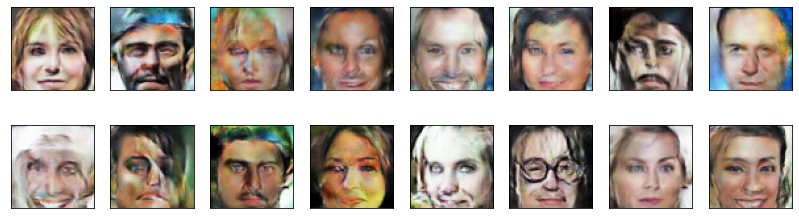

2023-06-03 23:21:26 | Epoch [38/50] | Batch 0/509 | d_loss: 0.3851 | g_loss: 5.2062
2023-06-03 23:21:27 | Epoch [38/50] | Batch 5/509 | d_loss: 0.3598 | g_loss: 7.3045
2023-06-03 23:21:29 | Epoch [38/50] | Batch 10/509 | d_loss: 0.3748 | g_loss: 3.9795
2023-06-03 23:21:31 | Epoch [38/50] | Batch 15/509 | d_loss: 0.3666 | g_loss: 4.8226
2023-06-03 23:21:32 | Epoch [38/50] | Batch 20/509 | d_loss: 0.3467 | g_loss: 7.5764
2023-06-03 23:21:34 | Epoch [38/50] | Batch 25/509 | d_loss: 0.4887 | g_loss: 3.7627
2023-06-03 23:21:36 | Epoch [38/50] | Batch 30/509 | d_loss: 0.3811 | g_loss: 4.1719
2023-06-03 23:21:37 | Epoch [38/50] | Batch 35/509 | d_loss: 0.3710 | g_loss: 5.0392
2023-06-03 23:21:39 | Epoch [38/50] | Batch 40/509 | d_loss: 0.4952 | g_loss: 3.5002
2023-06-03 23:21:41 | Epoch [38/50] | Batch 45/509 | d_loss: 0.3686 | g_loss: 4.5460
2023-06-03 23:21:42 | Epoch [38/50] | Batch 50/509 | d_loss: 0.4719 | g_loss: 4.2441
2023-06-03 23:21:44 | Epoch [38/50] | Batch 55/509 | d_loss: 0.3849

2023-06-03 23:24:03 | Epoch [38/50] | Batch 480/509 | d_loss: 0.5282 | g_loss: 5.3296
2023-06-03 23:24:05 | Epoch [38/50] | Batch 485/509 | d_loss: 0.4827 | g_loss: 4.1604
2023-06-03 23:24:07 | Epoch [38/50] | Batch 490/509 | d_loss: 0.4456 | g_loss: 4.5842
2023-06-03 23:24:08 | Epoch [38/50] | Batch 495/509 | d_loss: 0.4286 | g_loss: 2.7340
2023-06-03 23:24:10 | Epoch [38/50] | Batch 500/509 | d_loss: 0.3663 | g_loss: 5.0037
2023-06-03 23:24:11 | Epoch [38/50] | Batch 505/509 | d_loss: 0.4325 | g_loss: 3.4665


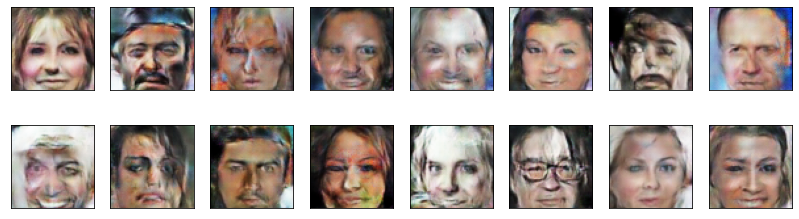

2023-06-03 23:24:14 | Epoch [39/50] | Batch 0/509 | d_loss: 0.4888 | g_loss: 4.5218
2023-06-03 23:24:16 | Epoch [39/50] | Batch 5/509 | d_loss: 0.3895 | g_loss: 4.1032
2023-06-03 23:24:17 | Epoch [39/50] | Batch 10/509 | d_loss: 0.4308 | g_loss: 3.2624
2023-06-03 23:24:19 | Epoch [39/50] | Batch 15/509 | d_loss: 0.4271 | g_loss: 5.6815
2023-06-03 23:24:20 | Epoch [39/50] | Batch 20/509 | d_loss: 0.4927 | g_loss: 4.6484
2023-06-03 23:24:22 | Epoch [39/50] | Batch 25/509 | d_loss: 0.3994 | g_loss: 3.3414
2023-06-03 23:24:24 | Epoch [39/50] | Batch 30/509 | d_loss: 0.3897 | g_loss: 3.4530
2023-06-03 23:24:25 | Epoch [39/50] | Batch 35/509 | d_loss: 0.3864 | g_loss: 3.9895
2023-06-03 23:24:27 | Epoch [39/50] | Batch 40/509 | d_loss: 0.3991 | g_loss: 4.7238
2023-06-03 23:24:29 | Epoch [39/50] | Batch 45/509 | d_loss: 0.4039 | g_loss: 2.5243
2023-06-03 23:24:30 | Epoch [39/50] | Batch 50/509 | d_loss: 0.3846 | g_loss: 4.6932
2023-06-03 23:24:32 | Epoch [39/50] | Batch 55/509 | d_loss: 0.4129

2023-06-03 23:26:51 | Epoch [39/50] | Batch 480/509 | d_loss: 0.4134 | g_loss: 5.3782
2023-06-03 23:26:53 | Epoch [39/50] | Batch 485/509 | d_loss: 0.3571 | g_loss: 4.2540
2023-06-03 23:26:54 | Epoch [39/50] | Batch 490/509 | d_loss: 0.3616 | g_loss: 3.8349
2023-06-03 23:26:56 | Epoch [39/50] | Batch 495/509 | d_loss: 0.4103 | g_loss: 5.5917
2023-06-03 23:26:58 | Epoch [39/50] | Batch 500/509 | d_loss: 0.3508 | g_loss: 6.7435
2023-06-03 23:26:59 | Epoch [39/50] | Batch 505/509 | d_loss: 0.3684 | g_loss: 4.6014


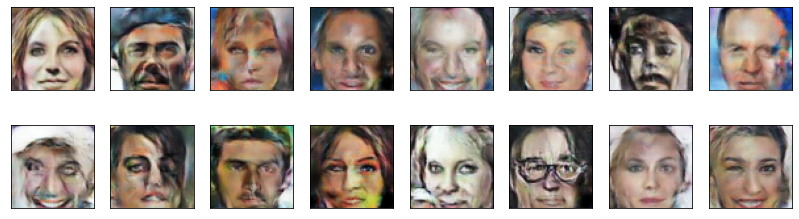

2023-06-03 23:27:02 | Epoch [40/50] | Batch 0/509 | d_loss: 0.3843 | g_loss: 4.2177
2023-06-03 23:27:03 | Epoch [40/50] | Batch 5/509 | d_loss: 0.5504 | g_loss: 1.8039
2023-06-03 23:27:05 | Epoch [40/50] | Batch 10/509 | d_loss: 0.3833 | g_loss: 4.9078
2023-06-03 23:27:07 | Epoch [40/50] | Batch 15/509 | d_loss: 0.3774 | g_loss: 4.8035
2023-06-03 23:27:08 | Epoch [40/50] | Batch 20/509 | d_loss: 0.3693 | g_loss: 4.3704
2023-06-03 23:27:10 | Epoch [40/50] | Batch 25/509 | d_loss: 0.3546 | g_loss: 5.1248
2023-06-03 23:27:12 | Epoch [40/50] | Batch 30/509 | d_loss: 0.4257 | g_loss: 5.2577
2023-06-03 23:27:13 | Epoch [40/50] | Batch 35/509 | d_loss: 0.3523 | g_loss: 5.2600
2023-06-03 23:27:15 | Epoch [40/50] | Batch 40/509 | d_loss: 0.3633 | g_loss: 4.3446
2023-06-03 23:27:17 | Epoch [40/50] | Batch 45/509 | d_loss: 0.3449 | g_loss: 7.2098
2023-06-03 23:27:18 | Epoch [40/50] | Batch 50/509 | d_loss: 0.3590 | g_loss: 5.1330
2023-06-03 23:27:20 | Epoch [40/50] | Batch 55/509 | d_loss: 0.3735

2023-06-03 23:29:39 | Epoch [40/50] | Batch 480/509 | d_loss: 0.4627 | g_loss: 3.9552
2023-06-03 23:29:41 | Epoch [40/50] | Batch 485/509 | d_loss: 0.3940 | g_loss: 3.6838
2023-06-03 23:29:42 | Epoch [40/50] | Batch 490/509 | d_loss: 0.3804 | g_loss: 3.6221
2023-06-03 23:29:44 | Epoch [40/50] | Batch 495/509 | d_loss: 0.4707 | g_loss: 3.5301
2023-06-03 23:29:46 | Epoch [40/50] | Batch 500/509 | d_loss: 0.3699 | g_loss: 2.7898
2023-06-03 23:29:47 | Epoch [40/50] | Batch 505/509 | d_loss: 0.3924 | g_loss: 4.0648


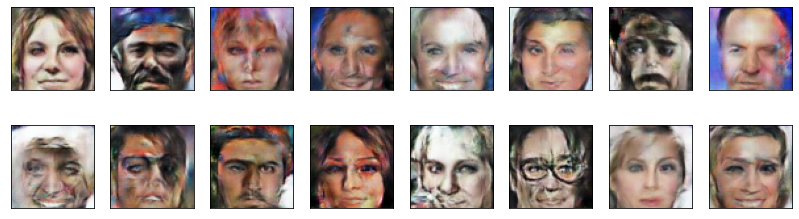

2023-06-03 23:29:50 | Epoch [41/50] | Batch 0/509 | d_loss: 0.4483 | g_loss: 3.9407
2023-06-03 23:29:51 | Epoch [41/50] | Batch 5/509 | d_loss: 0.3759 | g_loss: 4.5380
2023-06-03 23:29:53 | Epoch [41/50] | Batch 10/509 | d_loss: 0.3826 | g_loss: 4.3044
2023-06-03 23:29:55 | Epoch [41/50] | Batch 15/509 | d_loss: 0.4032 | g_loss: 4.4596
2023-06-03 23:29:56 | Epoch [41/50] | Batch 20/509 | d_loss: 0.3762 | g_loss: 3.6742
2023-06-03 23:29:58 | Epoch [41/50] | Batch 25/509 | d_loss: 0.3746 | g_loss: 3.4584
2023-06-03 23:30:00 | Epoch [41/50] | Batch 30/509 | d_loss: 0.3893 | g_loss: 4.2863
2023-06-03 23:30:01 | Epoch [41/50] | Batch 35/509 | d_loss: 0.3783 | g_loss: 5.2676
2023-06-03 23:30:03 | Epoch [41/50] | Batch 40/509 | d_loss: 0.4735 | g_loss: 3.5263
2023-06-03 23:30:04 | Epoch [41/50] | Batch 45/509 | d_loss: 0.4442 | g_loss: 3.5233
2023-06-03 23:30:06 | Epoch [41/50] | Batch 50/509 | d_loss: 0.4391 | g_loss: 3.9337
2023-06-03 23:30:08 | Epoch [41/50] | Batch 55/509 | d_loss: 0.3641

2023-06-03 23:32:27 | Epoch [41/50] | Batch 480/509 | d_loss: 0.4137 | g_loss: 3.2955
2023-06-03 23:32:28 | Epoch [41/50] | Batch 485/509 | d_loss: 0.3680 | g_loss: 4.3541
2023-06-03 23:32:30 | Epoch [41/50] | Batch 490/509 | d_loss: 0.3889 | g_loss: 4.6214
2023-06-03 23:32:32 | Epoch [41/50] | Batch 495/509 | d_loss: 0.3766 | g_loss: 4.5920
2023-06-03 23:32:33 | Epoch [41/50] | Batch 500/509 | d_loss: 0.3638 | g_loss: 6.1315
2023-06-03 23:32:35 | Epoch [41/50] | Batch 505/509 | d_loss: 0.4214 | g_loss: 5.2596


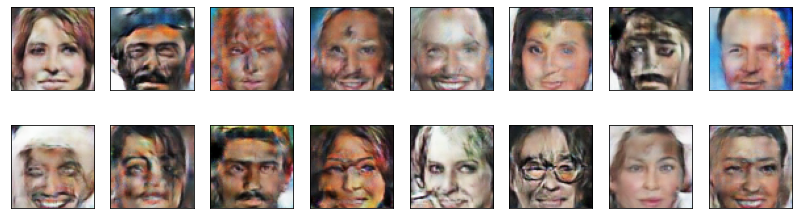

2023-06-03 23:32:38 | Epoch [42/50] | Batch 0/509 | d_loss: 0.3950 | g_loss: 5.5752
2023-06-03 23:32:39 | Epoch [42/50] | Batch 5/509 | d_loss: 0.3574 | g_loss: 5.8729
2023-06-03 23:32:41 | Epoch [42/50] | Batch 10/509 | d_loss: 0.3931 | g_loss: 3.7210
2023-06-03 23:32:43 | Epoch [42/50] | Batch 15/509 | d_loss: 0.3668 | g_loss: 6.4606
2023-06-03 23:32:44 | Epoch [42/50] | Batch 20/509 | d_loss: 0.4092 | g_loss: 4.7613
2023-06-03 23:32:46 | Epoch [42/50] | Batch 25/509 | d_loss: 0.3460 | g_loss: 4.6288
2023-06-03 23:32:47 | Epoch [42/50] | Batch 30/509 | d_loss: 0.3954 | g_loss: 5.3564
2023-06-03 23:32:49 | Epoch [42/50] | Batch 35/509 | d_loss: 0.3497 | g_loss: 5.4283
2023-06-03 23:32:51 | Epoch [42/50] | Batch 40/509 | d_loss: 0.3513 | g_loss: 5.3911
2023-06-03 23:32:52 | Epoch [42/50] | Batch 45/509 | d_loss: 0.3815 | g_loss: 4.4362
2023-06-03 23:32:54 | Epoch [42/50] | Batch 50/509 | d_loss: 0.3753 | g_loss: 5.1408
2023-06-03 23:32:56 | Epoch [42/50] | Batch 55/509 | d_loss: 0.3800

2023-06-03 23:35:15 | Epoch [42/50] | Batch 480/509 | d_loss: 0.4189 | g_loss: 3.3199
2023-06-03 23:35:17 | Epoch [42/50] | Batch 485/509 | d_loss: 0.3892 | g_loss: 4.8322
2023-06-03 23:35:18 | Epoch [42/50] | Batch 490/509 | d_loss: 0.3689 | g_loss: 4.5773
2023-06-03 23:35:20 | Epoch [42/50] | Batch 495/509 | d_loss: 0.3598 | g_loss: 5.0021
2023-06-03 23:35:22 | Epoch [42/50] | Batch 500/509 | d_loss: 0.3782 | g_loss: 5.3298
2023-06-03 23:35:23 | Epoch [42/50] | Batch 505/509 | d_loss: 0.5854 | g_loss: 1.4848


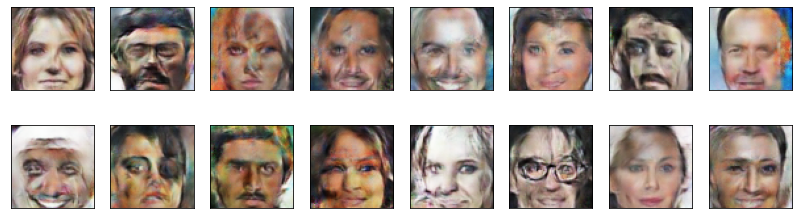

2023-06-03 23:35:26 | Epoch [43/50] | Batch 0/509 | d_loss: 0.3918 | g_loss: 4.6164
2023-06-03 23:35:27 | Epoch [43/50] | Batch 5/509 | d_loss: 0.3980 | g_loss: 4.6681
2023-06-03 23:35:29 | Epoch [43/50] | Batch 10/509 | d_loss: 0.3801 | g_loss: 3.9510
2023-06-03 23:35:31 | Epoch [43/50] | Batch 15/509 | d_loss: 0.4752 | g_loss: 2.9211
2023-06-03 23:35:32 | Epoch [43/50] | Batch 20/509 | d_loss: 0.4225 | g_loss: 3.2362
2023-06-03 23:35:34 | Epoch [43/50] | Batch 25/509 | d_loss: 0.3910 | g_loss: 4.3547
2023-06-03 23:35:36 | Epoch [43/50] | Batch 30/509 | d_loss: 0.3539 | g_loss: 5.2932
2023-06-03 23:35:37 | Epoch [43/50] | Batch 35/509 | d_loss: 0.3720 | g_loss: 5.6015
2023-06-03 23:35:39 | Epoch [43/50] | Batch 40/509 | d_loss: 0.3803 | g_loss: 4.6804
2023-06-03 23:35:40 | Epoch [43/50] | Batch 45/509 | d_loss: 0.6016 | g_loss: 4.1788
2023-06-03 23:35:42 | Epoch [43/50] | Batch 50/509 | d_loss: 1.7314 | g_loss: 6.7904
2023-06-03 23:35:44 | Epoch [43/50] | Batch 55/509 | d_loss: 0.4479

2023-06-03 23:38:03 | Epoch [43/50] | Batch 480/509 | d_loss: 0.4207 | g_loss: 3.7760
2023-06-03 23:38:05 | Epoch [43/50] | Batch 485/509 | d_loss: 0.3670 | g_loss: 5.2190
2023-06-03 23:38:06 | Epoch [43/50] | Batch 490/509 | d_loss: 0.4619 | g_loss: 4.0701
2023-06-03 23:38:08 | Epoch [43/50] | Batch 495/509 | d_loss: 0.4929 | g_loss: 2.6763
2023-06-03 23:38:09 | Epoch [43/50] | Batch 500/509 | d_loss: 0.3894 | g_loss: 5.2893
2023-06-03 23:38:11 | Epoch [43/50] | Batch 505/509 | d_loss: 0.3641 | g_loss: 4.7784


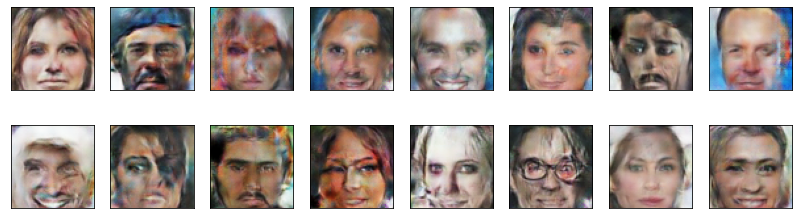

2023-06-03 23:38:14 | Epoch [44/50] | Batch 0/509 | d_loss: 0.3800 | g_loss: 3.9308
2023-06-03 23:38:15 | Epoch [44/50] | Batch 5/509 | d_loss: 0.3606 | g_loss: 4.7340
2023-06-03 23:38:17 | Epoch [44/50] | Batch 10/509 | d_loss: 0.4212 | g_loss: 2.9516
2023-06-03 23:38:19 | Epoch [44/50] | Batch 15/509 | d_loss: 0.4864 | g_loss: 3.6945
2023-06-03 23:38:20 | Epoch [44/50] | Batch 20/509 | d_loss: 0.5098 | g_loss: 3.0842
2023-06-03 23:38:22 | Epoch [44/50] | Batch 25/509 | d_loss: 0.3844 | g_loss: 4.6358
2023-06-03 23:38:23 | Epoch [44/50] | Batch 30/509 | d_loss: 0.3774 | g_loss: 4.1057
2023-06-03 23:38:25 | Epoch [44/50] | Batch 35/509 | d_loss: 0.6378 | g_loss: 1.7368
2023-06-03 23:38:27 | Epoch [44/50] | Batch 40/509 | d_loss: 0.6606 | g_loss: 1.7429
2023-06-03 23:38:28 | Epoch [44/50] | Batch 45/509 | d_loss: 0.3794 | g_loss: 4.2060
2023-06-03 23:38:30 | Epoch [44/50] | Batch 50/509 | d_loss: 0.6331 | g_loss: 3.6833
2023-06-03 23:38:32 | Epoch [44/50] | Batch 55/509 | d_loss: 0.4053

2023-06-03 23:40:51 | Epoch [44/50] | Batch 480/509 | d_loss: 0.3797 | g_loss: 4.8812
2023-06-03 23:40:53 | Epoch [44/50] | Batch 485/509 | d_loss: 0.7484 | g_loss: 4.7937
2023-06-03 23:40:54 | Epoch [44/50] | Batch 490/509 | d_loss: 0.3476 | g_loss: 6.5356
2023-06-03 23:40:56 | Epoch [44/50] | Batch 495/509 | d_loss: 0.3816 | g_loss: 5.7061
2023-06-03 23:40:57 | Epoch [44/50] | Batch 500/509 | d_loss: 0.5278 | g_loss: 5.6830
2023-06-03 23:40:59 | Epoch [44/50] | Batch 505/509 | d_loss: 0.3879 | g_loss: 5.5106


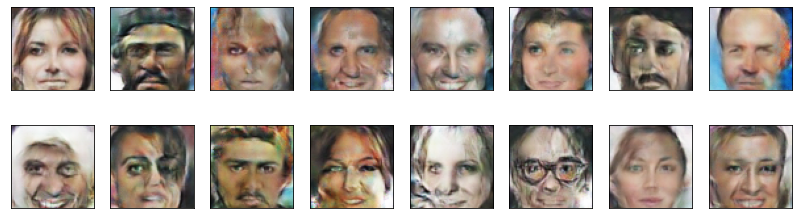

2023-06-03 23:41:02 | Epoch [45/50] | Batch 0/509 | d_loss: 0.3924 | g_loss: 3.9472
2023-06-03 23:41:03 | Epoch [45/50] | Batch 5/509 | d_loss: 0.4042 | g_loss: 3.4929
2023-06-03 23:41:05 | Epoch [45/50] | Batch 10/509 | d_loss: 0.4367 | g_loss: 2.3860
2023-06-03 23:41:06 | Epoch [45/50] | Batch 15/509 | d_loss: 0.3932 | g_loss: 3.9386
2023-06-03 23:41:08 | Epoch [45/50] | Batch 20/509 | d_loss: 0.3853 | g_loss: 5.2556
2023-06-03 23:41:10 | Epoch [45/50] | Batch 25/509 | d_loss: 0.3655 | g_loss: 4.7828
2023-06-03 23:41:11 | Epoch [45/50] | Batch 30/509 | d_loss: 0.3696 | g_loss: 7.4464
2023-06-03 23:41:13 | Epoch [45/50] | Batch 35/509 | d_loss: 0.4068 | g_loss: 4.1985
2023-06-03 23:41:15 | Epoch [45/50] | Batch 40/509 | d_loss: 0.9432 | g_loss: 2.7473
2023-06-03 23:41:16 | Epoch [45/50] | Batch 45/509 | d_loss: 0.6282 | g_loss: 3.5020
2023-06-03 23:41:18 | Epoch [45/50] | Batch 50/509 | d_loss: 0.4993 | g_loss: 3.5314
2023-06-03 23:41:20 | Epoch [45/50] | Batch 55/509 | d_loss: 0.4245

2023-06-03 23:43:39 | Epoch [45/50] | Batch 480/509 | d_loss: 0.3698 | g_loss: 4.2011
2023-06-03 23:43:40 | Epoch [45/50] | Batch 485/509 | d_loss: 0.4032 | g_loss: 3.5539
2023-06-03 23:43:42 | Epoch [45/50] | Batch 490/509 | d_loss: 0.3777 | g_loss: 3.6414
2023-06-03 23:43:44 | Epoch [45/50] | Batch 495/509 | d_loss: 0.4287 | g_loss: 4.1323
2023-06-03 23:43:45 | Epoch [45/50] | Batch 500/509 | d_loss: 0.3632 | g_loss: 3.6894
2023-06-03 23:43:47 | Epoch [45/50] | Batch 505/509 | d_loss: 0.4503 | g_loss: 4.6016


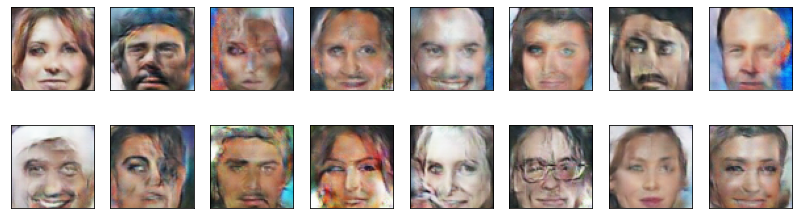

2023-06-03 23:43:49 | Epoch [46/50] | Batch 0/509 | d_loss: 0.3929 | g_loss: 4.7797
2023-06-03 23:43:51 | Epoch [46/50] | Batch 5/509 | d_loss: 0.4029 | g_loss: 4.8060
2023-06-03 23:43:53 | Epoch [46/50] | Batch 10/509 | d_loss: 0.3732 | g_loss: 4.3113
2023-06-03 23:43:54 | Epoch [46/50] | Batch 15/509 | d_loss: 0.3768 | g_loss: 3.0829
2023-06-03 23:43:56 | Epoch [46/50] | Batch 20/509 | d_loss: 0.3853 | g_loss: 3.7973
2023-06-03 23:43:57 | Epoch [46/50] | Batch 25/509 | d_loss: 0.4819 | g_loss: 2.3441
2023-06-03 23:43:59 | Epoch [46/50] | Batch 30/509 | d_loss: 0.3748 | g_loss: 3.5694
2023-06-03 23:44:01 | Epoch [46/50] | Batch 35/509 | d_loss: 0.4116 | g_loss: 4.6271
2023-06-03 23:44:02 | Epoch [46/50] | Batch 40/509 | d_loss: 0.3495 | g_loss: 7.0842
2023-06-03 23:44:04 | Epoch [46/50] | Batch 45/509 | d_loss: 0.5455 | g_loss: 5.5441
2023-06-03 23:44:06 | Epoch [46/50] | Batch 50/509 | d_loss: 0.4204 | g_loss: 5.0560
2023-06-03 23:44:07 | Epoch [46/50] | Batch 55/509 | d_loss: 0.3646

2023-06-03 23:46:27 | Epoch [46/50] | Batch 480/509 | d_loss: 0.4943 | g_loss: 4.2913
2023-06-03 23:46:28 | Epoch [46/50] | Batch 485/509 | d_loss: 0.4303 | g_loss: 4.9222
2023-06-03 23:46:30 | Epoch [46/50] | Batch 490/509 | d_loss: 0.4502 | g_loss: 2.2379
2023-06-03 23:46:31 | Epoch [46/50] | Batch 495/509 | d_loss: 0.3971 | g_loss: 3.9404
2023-06-03 23:46:33 | Epoch [46/50] | Batch 500/509 | d_loss: 0.4163 | g_loss: 5.9079
2023-06-03 23:46:35 | Epoch [46/50] | Batch 505/509 | d_loss: 0.3951 | g_loss: 3.2697


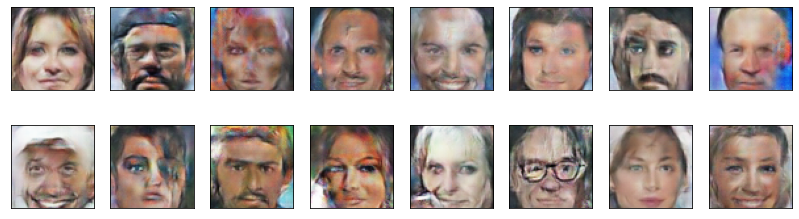

2023-06-03 23:46:37 | Epoch [47/50] | Batch 0/509 | d_loss: 0.3996 | g_loss: 4.3911
2023-06-03 23:46:39 | Epoch [47/50] | Batch 5/509 | d_loss: 0.4358 | g_loss: 4.0284
2023-06-03 23:46:41 | Epoch [47/50] | Batch 10/509 | d_loss: 0.4216 | g_loss: 4.5763
2023-06-03 23:46:42 | Epoch [47/50] | Batch 15/509 | d_loss: 0.4094 | g_loss: 4.9952
2023-06-03 23:46:44 | Epoch [47/50] | Batch 20/509 | d_loss: 0.3705 | g_loss: 3.7731
2023-06-03 23:46:46 | Epoch [47/50] | Batch 25/509 | d_loss: 0.3814 | g_loss: 4.0777
2023-06-03 23:46:47 | Epoch [47/50] | Batch 30/509 | d_loss: 0.3945 | g_loss: 3.8748
2023-06-03 23:46:49 | Epoch [47/50] | Batch 35/509 | d_loss: 0.3651 | g_loss: 4.6314
2023-06-03 23:46:50 | Epoch [47/50] | Batch 40/509 | d_loss: 0.4114 | g_loss: 3.4291
2023-06-03 23:46:52 | Epoch [47/50] | Batch 45/509 | d_loss: 0.3766 | g_loss: 4.3990
2023-06-03 23:46:54 | Epoch [47/50] | Batch 50/509 | d_loss: 0.4474 | g_loss: 4.3489
2023-06-03 23:46:55 | Epoch [47/50] | Batch 55/509 | d_loss: 0.3526

2023-06-03 23:49:15 | Epoch [47/50] | Batch 480/509 | d_loss: 0.3764 | g_loss: 4.4884
2023-06-03 23:49:16 | Epoch [47/50] | Batch 485/509 | d_loss: 0.5434 | g_loss: 2.7265
2023-06-03 23:49:18 | Epoch [47/50] | Batch 490/509 | d_loss: 0.4056 | g_loss: 3.8118
2023-06-03 23:49:20 | Epoch [47/50] | Batch 495/509 | d_loss: 0.4127 | g_loss: 5.6041
2023-06-03 23:49:21 | Epoch [47/50] | Batch 500/509 | d_loss: 0.4924 | g_loss: 4.5455
2023-06-03 23:49:23 | Epoch [47/50] | Batch 505/509 | d_loss: 0.4041 | g_loss: 3.1538


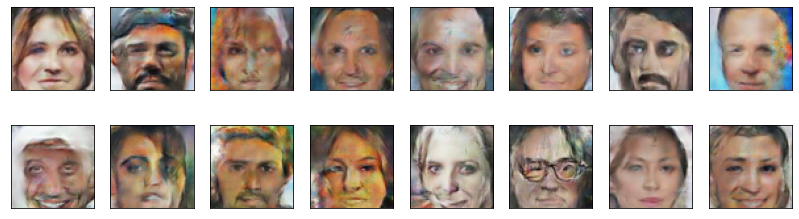

2023-06-03 23:49:25 | Epoch [48/50] | Batch 0/509 | d_loss: 0.5345 | g_loss: 5.8133
2023-06-03 23:49:27 | Epoch [48/50] | Batch 5/509 | d_loss: 0.6254 | g_loss: 3.7948
2023-06-03 23:49:28 | Epoch [48/50] | Batch 10/509 | d_loss: 0.4364 | g_loss: 3.2663
2023-06-03 23:49:30 | Epoch [48/50] | Batch 15/509 | d_loss: 0.4765 | g_loss: 4.1523
2023-06-03 23:49:32 | Epoch [48/50] | Batch 20/509 | d_loss: 0.4459 | g_loss: 2.7788
2023-06-03 23:49:33 | Epoch [48/50] | Batch 25/509 | d_loss: 0.4163 | g_loss: 4.0090
2023-06-03 23:49:35 | Epoch [48/50] | Batch 30/509 | d_loss: 0.5129 | g_loss: 2.5923
2023-06-03 23:49:37 | Epoch [48/50] | Batch 35/509 | d_loss: 0.3874 | g_loss: 4.9812
2023-06-03 23:49:38 | Epoch [48/50] | Batch 40/509 | d_loss: 0.4084 | g_loss: 3.9953
2023-06-03 23:49:40 | Epoch [48/50] | Batch 45/509 | d_loss: 0.3786 | g_loss: 5.1741
2023-06-03 23:49:42 | Epoch [48/50] | Batch 50/509 | d_loss: 0.3824 | g_loss: 5.8045
2023-06-03 23:49:43 | Epoch [48/50] | Batch 55/509 | d_loss: 0.4144

2023-06-03 23:52:03 | Epoch [48/50] | Batch 480/509 | d_loss: 0.3925 | g_loss: 3.3760
2023-06-03 23:52:04 | Epoch [48/50] | Batch 485/509 | d_loss: 0.3745 | g_loss: 4.3860
2023-06-03 23:52:06 | Epoch [48/50] | Batch 490/509 | d_loss: 0.3734 | g_loss: 4.8773
2023-06-03 23:52:08 | Epoch [48/50] | Batch 495/509 | d_loss: 0.3447 | g_loss: 7.9290
2023-06-03 23:52:09 | Epoch [48/50] | Batch 500/509 | d_loss: 0.4596 | g_loss: 3.6084
2023-06-03 23:52:11 | Epoch [48/50] | Batch 505/509 | d_loss: 0.3995 | g_loss: 6.6537


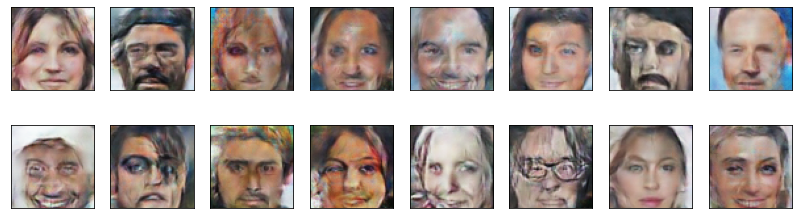

2023-06-03 23:52:13 | Epoch [49/50] | Batch 0/509 | d_loss: 0.3842 | g_loss: 2.5593
2023-06-03 23:52:15 | Epoch [49/50] | Batch 5/509 | d_loss: 0.4005 | g_loss: 4.3695
2023-06-03 23:52:17 | Epoch [49/50] | Batch 10/509 | d_loss: 0.3769 | g_loss: 5.3569
2023-06-03 23:52:18 | Epoch [49/50] | Batch 15/509 | d_loss: 0.4805 | g_loss: 2.9101
2023-06-03 23:52:20 | Epoch [49/50] | Batch 20/509 | d_loss: 0.4197 | g_loss: 3.8134
2023-06-03 23:52:22 | Epoch [49/50] | Batch 25/509 | d_loss: 0.3666 | g_loss: 4.6082
2023-06-03 23:52:23 | Epoch [49/50] | Batch 30/509 | d_loss: 0.3583 | g_loss: 4.8464
2023-06-03 23:52:25 | Epoch [49/50] | Batch 35/509 | d_loss: 0.3422 | g_loss: 5.2786
2023-06-03 23:52:26 | Epoch [49/50] | Batch 40/509 | d_loss: 0.4294 | g_loss: 4.1374
2023-06-03 23:52:28 | Epoch [49/50] | Batch 45/509 | d_loss: 0.3557 | g_loss: 5.4206
2023-06-03 23:52:30 | Epoch [49/50] | Batch 50/509 | d_loss: 0.4063 | g_loss: 2.5170
2023-06-03 23:52:31 | Epoch [49/50] | Batch 55/509 | d_loss: 0.3620

2023-06-03 23:54:51 | Epoch [49/50] | Batch 480/509 | d_loss: 0.4133 | g_loss: 4.1162
2023-06-03 23:54:52 | Epoch [49/50] | Batch 485/509 | d_loss: 0.4072 | g_loss: 3.5465
2023-06-03 23:54:54 | Epoch [49/50] | Batch 490/509 | d_loss: 0.4062 | g_loss: 3.9632
2023-06-03 23:54:56 | Epoch [49/50] | Batch 495/509 | d_loss: 0.3896 | g_loss: 4.5337
2023-06-03 23:54:57 | Epoch [49/50] | Batch 500/509 | d_loss: 0.3720 | g_loss: 4.7742
2023-06-03 23:54:59 | Epoch [49/50] | Batch 505/509 | d_loss: 0.4163 | g_loss: 3.0977


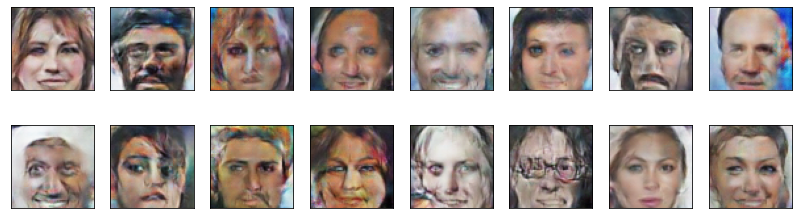

2023-06-03 23:55:01 | Epoch [50/50] | Batch 0/509 | d_loss: 0.5775 | g_loss: 5.1451
2023-06-03 23:55:03 | Epoch [50/50] | Batch 5/509 | d_loss: 0.4222 | g_loss: 4.2436
2023-06-03 23:55:05 | Epoch [50/50] | Batch 10/509 | d_loss: 0.3763 | g_loss: 4.8027
2023-06-03 23:55:06 | Epoch [50/50] | Batch 15/509 | d_loss: 0.3800 | g_loss: 3.9280
2023-06-03 23:55:08 | Epoch [50/50] | Batch 20/509 | d_loss: 0.4275 | g_loss: 3.6192
2023-06-03 23:55:09 | Epoch [50/50] | Batch 25/509 | d_loss: 0.5182 | g_loss: 2.5700
2023-06-03 23:55:11 | Epoch [50/50] | Batch 30/509 | d_loss: 0.3908 | g_loss: 3.4936
2023-06-03 23:55:13 | Epoch [50/50] | Batch 35/509 | d_loss: 0.3660 | g_loss: 5.1719
2023-06-03 23:55:14 | Epoch [50/50] | Batch 40/509 | d_loss: 0.3687 | g_loss: 4.0996
2023-06-03 23:55:16 | Epoch [50/50] | Batch 45/509 | d_loss: 0.3868 | g_loss: 3.3425
2023-06-03 23:55:18 | Epoch [50/50] | Batch 50/509 | d_loss: 0.3727 | g_loss: 3.0217
2023-06-03 23:55:19 | Epoch [50/50] | Batch 55/509 | d_loss: 0.4096

2023-06-03 23:57:39 | Epoch [50/50] | Batch 480/509 | d_loss: 0.3688 | g_loss: 4.2336
2023-06-03 23:57:40 | Epoch [50/50] | Batch 485/509 | d_loss: 0.6088 | g_loss: 5.0864
2023-06-03 23:57:42 | Epoch [50/50] | Batch 490/509 | d_loss: 0.3781 | g_loss: 3.5711
2023-06-03 23:57:44 | Epoch [50/50] | Batch 495/509 | d_loss: 0.3575 | g_loss: 5.5813
2023-06-03 23:57:45 | Epoch [50/50] | Batch 500/509 | d_loss: 0.4479 | g_loss: 4.3170
2023-06-03 23:57:47 | Epoch [50/50] | Batch 505/509 | d_loss: 0.3666 | g_loss: 3.6110


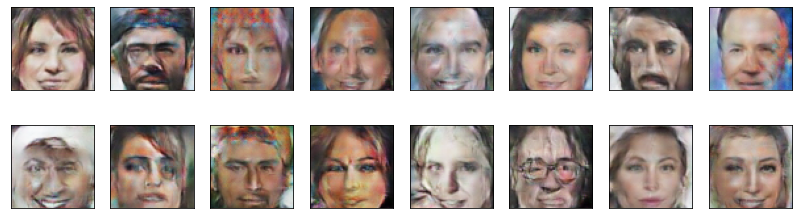

In [46]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        real_images = scale(real_images)
        ####################################
        
        # TODO: implement the training strategy
               
        d_loss = discriminator_step(batch_size, latent_dim, real_images)
        
        g_loss = generator_step(batch_size, latent_dim)
        
        ####################################
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
            save_model(discriminator, generator, d_optimizer, g_optimizer)
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

with open('generated_images.pkl', 'wb') as f:
    pkl.dump(generated_images, f)

### Training losses

Plot the training losses for the generator and discriminator.

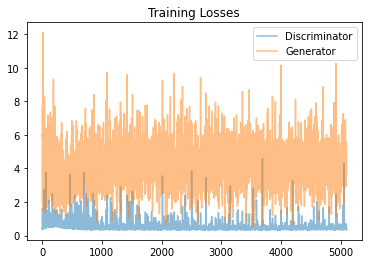

In [47]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [2]:
'''Reference :-
    1. Udacity DCGAN project and Solution
    2. DCGAN TUTORIAL
       https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html
    3. Modren GAN (BCE loss and Wasserstein Loss)  functions'''
    

'Reference :-\n    1. Udacity DCGAN project and Solution\n    2. DCGAN TUTORIAL\n       https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html\n    3. Modren GAN (BCE loss and Wasserstein Loss)  functions'

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** 
1. The generated images of humans are white because of the dataset
2. Large model means adding more layers will give better results because it can learn more features in data space
3. Optimization function and selection of learning rate can improve the training of face generation
4. Training with more epochs yes will improve results
5. Adding a dropout layer to stop training when the result degrades
6. Switching the loss function can improve the results like the Wasserstein loss
7. Switching the activation function can also improve results




### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.